# *Merged Jupyter Notebook*

## DOMAIN: 
Automobile
### CONTEXT: 
The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 continuous attributes <br />
### DATA DESCRIPTION: 
The data concerns city-cycle fuel consumption in miles per gallon <br />
###  Attribute Information:
1. mpg: continuous
2. cylinders(cyl): multi-valued discrete
3. displacement(disp): continuous
4. horsepower(hp): continuous
5. weight(wt): continuous
6. acceleration(acc): continuous
7. model year(yr): multi-valued discrete
8. origin: multi-valued discrete
9. car name: string (unique for each instance) <br/>

### PROJECT OBJECTIVE: 
PROJECT OBJECTIVE: Goal is to cluster the data and treat them as individual datasets to train Regression models to predict ‘mpg’
Steps and tasks: [ Total Score: 25 points]
1. Import and warehouse data: [ Score: 3 points ]
• Import all the given datasets and explore shape and size.
• Merge all datasets onto one and explore final shape and size.
• Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.
• Import the data from above steps into python.
2. Data cleansing: [ Score: 3 points ]
• Missing/incorrect value treatment
• Drop attribute/s if required using relevant functional knowledge
• Perform another kind of corrections/treatment on the data.
3. Data analysis & visualisation: [ Score: 4 points ]
• Perform detailed statistical analysis on the data.
• Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.
Hint: Use your best analytical approach. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.
4. Machine learning: [ Score: 8 points ]
• Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.
• Share your insights about the difference in using these two methods.
5. Answer below questions based on outcomes of using ML based methods. [ Score: 5 points ]
• Mention how many optimal clusters are present in the data and what could be the possible reason behind it.
• Use linear regression model on different clusters separately and print the coefficients of the models individually
• How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.
6. Improvisation: [ Score: 2 points ]
• Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to perform a better data analysis in future.

In [1]:
#Loading the required packages
import numpy as np   
from sklearn.linear_model import LinearRegression
from scipy import stats 
from scipy.stats import zscore
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_samples, silhouette_score
import pandas as pd    
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline 
sns.set(color_codes=True)
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

In [2]:
#Loading the json file and concatinating it with car names
carjson=pd.read_json ('car.json')
carcsv=pd.read_csv('Part1 - Car name.csv')
car=pd.concat([carjson,carcsv],axis=1)
car.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [3]:
row, column = car.shape
print('The dataset contains', row, 'rows and', column, 'columns')

The dataset contains 398 rows and 9 columns


In [4]:
# save this data as to csv,xlsx and json
car.to_csv('mpg.csv', index=False)
car.to_excel('mpg.xlsx', index = False)
car.to_json('mpg.json', orient = 'split', compression = 'infer', index = 'true')

In [5]:
#dropping/ignoring car_name 
car = car.drop('car_name', axis=1)
# Also replacing the categorical var with actual values
car['origin'] = car['origin'].replace({1: 'america', 2: 'europe', 3: 'asia'})
car.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,america
1,15.0,8,350.0,165,3693,11.5,70,america
2,18.0,8,318.0,150,3436,11.0,70,america
3,16.0,8,304.0,150,3433,12.0,70,america
4,17.0,8,302.0,140,3449,10.5,70,america


In [6]:
print('The data type of each attribute: \n')
car.info()

The data type of each attribute: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    object 
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
 7   origin  398 non-null    object 
dtypes: float64(3), int64(3), object(2)
memory usage: 25.0+ KB


In [7]:
#5-point summary
car.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0


In [8]:
# isdigit()? on 'horsepower' 
hpIsDigit = pd.DataFrame(car.hp.str.isdigit()) 

#print isDigit = False!
car[hpIsDigit['hp'] == False]  

,mpg,cyl,disp,hp,wt,acc,yr,origin
32,25.0,4,98.0,?,2046,19.0,71,america
126,21.0,6,200.0,?,2875,17.0,74,america
330,40.9,4,85.0,?,1835,17.3,80,europe
336,23.6,4,140.0,?,2905,14.3,80,america
354,34.5,4,100.0,?,2320,15.8,81,europe
374,23.0,4,151.0,?,3035,20.5,82,america


In [9]:
# Replace missing values with NaN
car = car.replace('?', np.nan)
car[hpIsDigit['hp'] == False] 

,mpg,cyl,disp,hp,wt,acc,yr,origin
32,25.0,4,98.0,NaN,2046,19.0,71,america
126,21.0,6,200.0,NaN,2875,17.0,74,america
330,40.9,4,85.0,NaN,1835,17.3,80,europe
336,23.6,4,140.0,NaN,2905,14.3,80,america
354,34.5,4,100.0,NaN,2320,15.8,81,europe
374,23.0,4,151.0,NaN,3035,20.5,82,america


In [10]:
#replace the missing values with median value. 
car.median()

mpg       23.0
cyl        4.0
disp     148.5
hp        93.5
wt      2803.5
acc       15.5
yr        76.0
dtype: float64

In [11]:
#replace hp with median
car['hp'].fillna((car['hp'].median()), inplace=True)

In [12]:
print('The data set has no missing values \n')
car.isnull().sum()

The data set has no missing values 



mpg       0
cyl       0
disp      0
hp        0
wt        0
acc       0
yr        0
origin    0
dtype: int64

In [13]:
#creating mpg_level attribute using the 25% and 75% of mpg values( <  17 as low, > 17 and <29 as medium, > 29 as high  )
car['mpg_level'] = car['mpg'].apply(lambda x: 'low' if x<17 else 'high' if x>29 else 'medium')
car.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,mpg_level
0,18.0,8,307.0,130.0,3504,12.0,70,america,medium
1,15.0,8,350.0,165.0,3693,11.5,70,america,low
2,18.0,8,318.0,150.0,3436,11.0,70,america,medium
3,16.0,8,304.0,150.0,3433,12.0,70,america,low
4,17.0,8,302.0,140.0,3449,10.5,70,america,medium


In [14]:
#categorical variable
car_cat = car.iloc[:,[1,6,7,8]]
car_cat.head()

,cyl,yr,origin,mpg_level
0,8,70,america,medium
1,8,70,america,low
2,8,70,america,medium
3,8,70,america,low
4,8,70,america,medium


In [15]:
#numeric variables
car_num=car.drop(['cyl','yr','origin','mpg_level'],axis=1)
car_num.head()

,mpg,disp,hp,wt,acc
0,18.0,307.0,130.0,3504,12.0
1,15.0,350.0,165.0,3693,11.5
2,18.0,318.0,150.0,3436,11.0
3,16.0,304.0,150.0,3433,12.0
4,17.0,302.0,140.0,3449,10.5


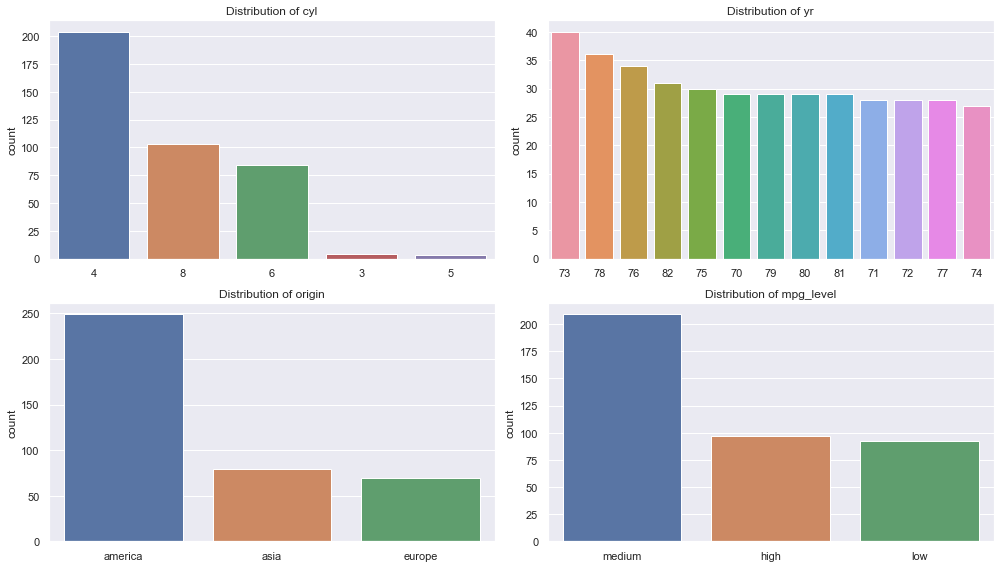

In [16]:
#plotting categorical variables
fig = plt.figure(1, (14, 8))

for i,car in enumerate(car_cat.columns):
    ax = plt.subplot(2,2,i+1)
    sns.countplot(car_cat[car], order=car_cat[car].value_counts().index)
    ax.set_xlabel(None)
    ax.set_title(f'Distribution of {car}')
    plt.tight_layout()

plt.show()

American 4 cylinder cars produced in 1973 with medium mpg level seem to dominate the dateset

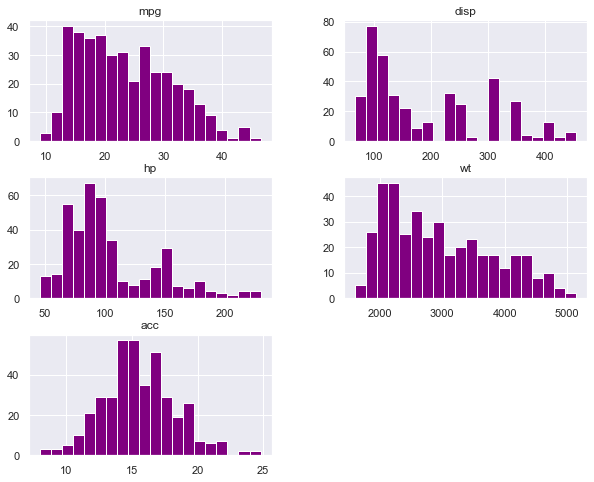

In [17]:
#plot histograms
car_num.hist(bins = 20, figsize = (10, 8), color = 'purple')
plt.show()

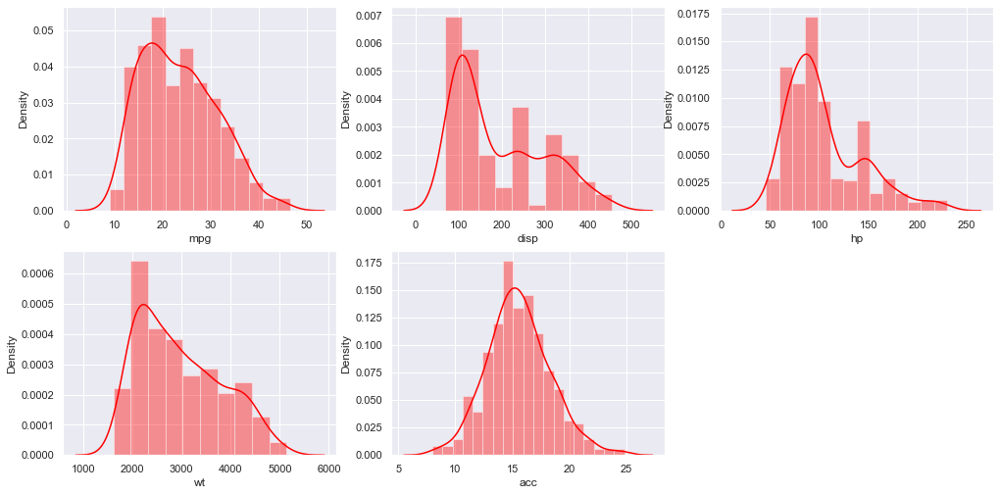

In [18]:
#plot density
plt.figure(figsize=(17, 13))
col = 1
for i in car_num.columns:
    plt.subplot(3, 3, col)
    sns.distplot(car_num[i], color = 'red')
    col += 1 

Displacement and Horsepower seem to be skewed to the right

In [19]:
#joining the categorical and numerical variables
car=pd.concat([car_cat,car_num],axis=1)

In [20]:
#checking for attribute type
car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   cyl        398 non-null    int64  
 1   yr         398 non-null    int64  
 2   origin     398 non-null    object 
 3   mpg_level  398 non-null    object 
 4   mpg        398 non-null    float64
 5   disp       398 non-null    float64
 6   hp         398 non-null    float64
 7   wt         398 non-null    int64  
 8   acc        398 non-null    float64
dtypes: float64(4), int64(3), object(2)
memory usage: 28.1+ KB


In [21]:
#create dummy varibale for mpg_level and origin and creating a seperate datset for k-means and heirarchical clustering
car = pd.get_dummies(car, columns=['origin'])
car = pd.get_dummies(car, columns=['mpg_level'])
car.head()
carH=car.copy()
carK=car.copy()

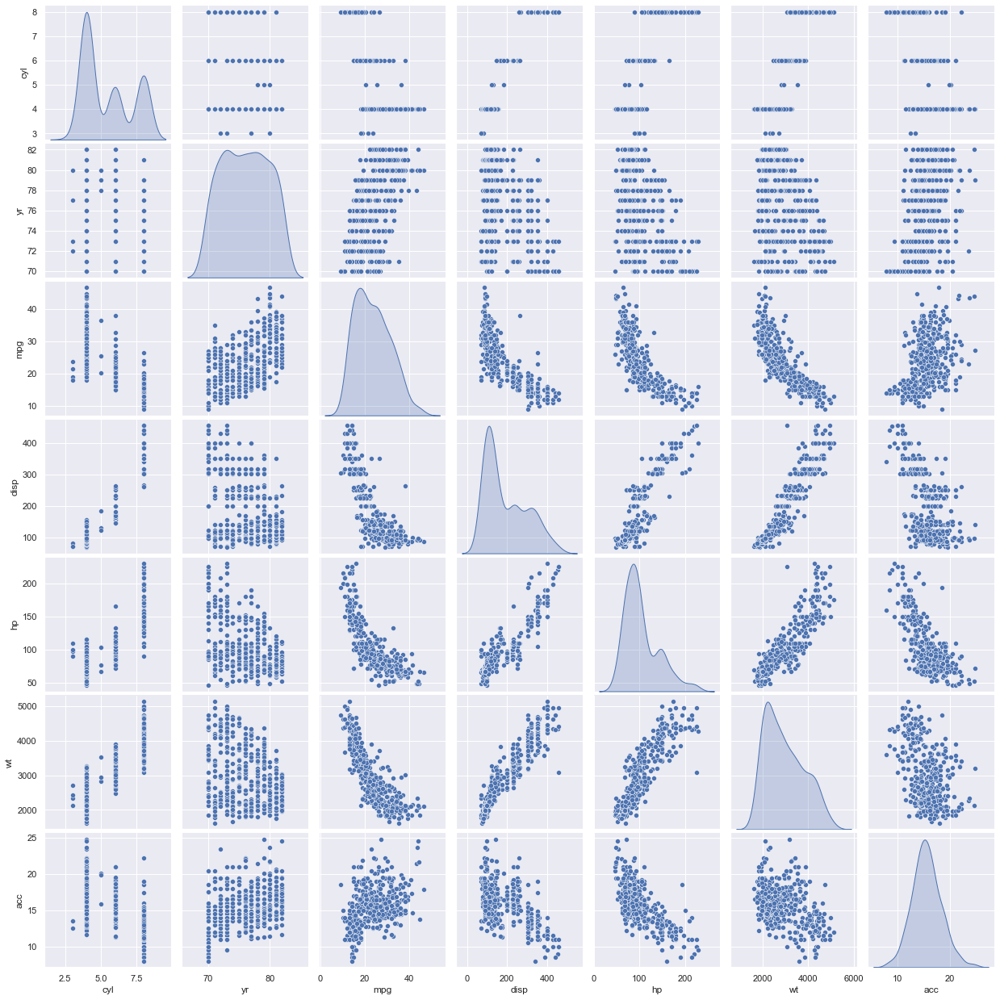

In [22]:
#pair plot for the numeric attributes
car_attr = car.iloc[:, 0:7]
sns.pairplot(car_attr, diag_kind='kde');

There appears to be a linear relationship between the variables

In [23]:
#dropping the created dummy variable
car2=car.drop(['origin_america','origin_asia','origin_europe','mpg_level_high','mpg_level_low','mpg_level_medium'],axis=1)


#### Checking of Outliers

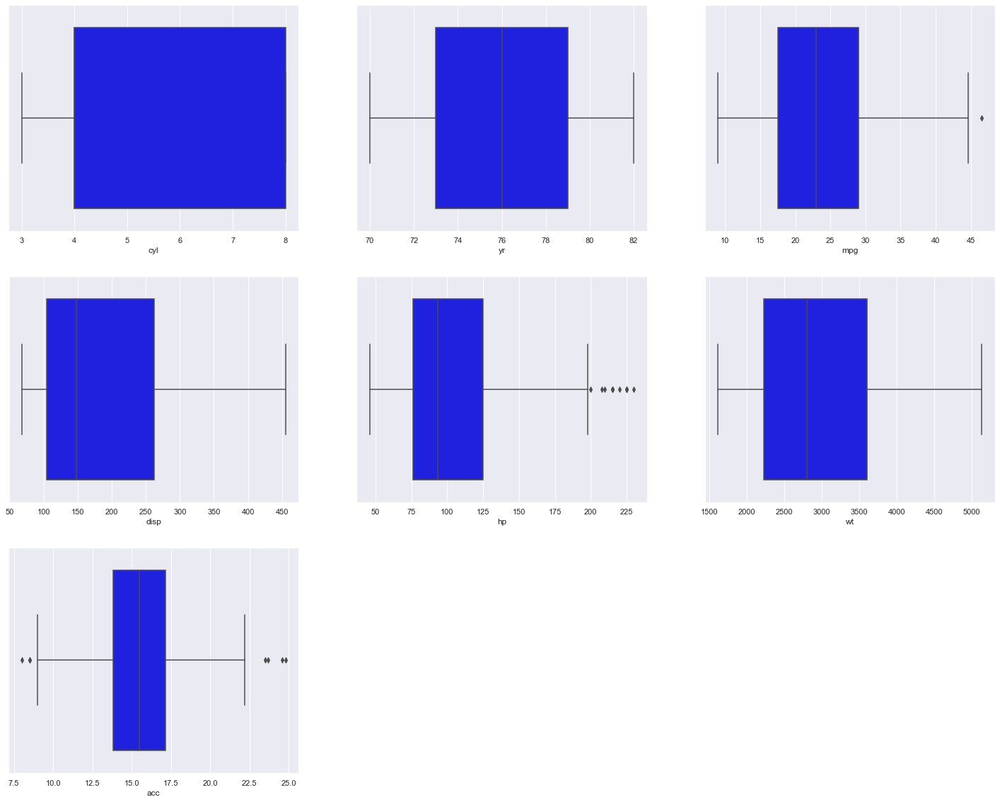

In [24]:
plt.figure(figsize=(25, 20))
col = 1
for i in car2.columns:
    plt.subplot(3, 3, col)
    sns.boxplot(car2[i],color='blue')
    col += 1

In [25]:
#replacing outliers with IQR (Q1 and Q3 +-1.5*IQR)
IQR1 = stats.iqr(car2['hp'], interpolation = 'midpoint')
IQR2 = stats.iqr(car2['acc'], interpolation = 'midpoint')

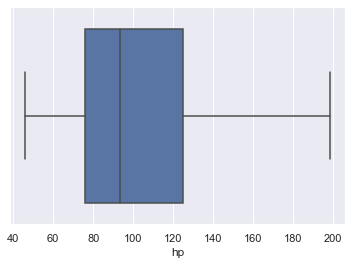

In [26]:
#Horsepower after imputing outliers
Q3 = car2['hp'].quantile(0.75)
car2['hp'] = np.where(car2["hp"] >(Q3+1.5*IQR1), 198.5,car2['hp'])
sns.boxplot(car2['hp']);

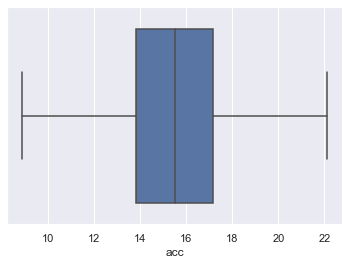

In [27]:
#accelaration after imputing outliers
Q1 = car2['acc'].quantile(0.25)
Q31=car2['acc'].quantile(0.75)
car2['acc'] = np.where(car2["acc"] >(Q31+1.5*IQR2),22.10 ,car2['acc'])
car2['acc'] = np.where(car2["acc"] <(Q1-1.5*IQR2),(Q1-1.5*IQR2),car2['acc'])
sns.boxplot(car2['acc']);

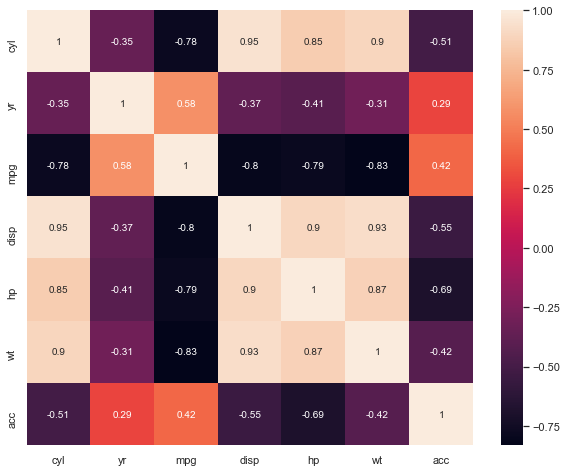

In [28]:
#checking for correlation
plt.figure(figsize=(10,8))
corr=car2.corr()
sns.heatmap(corr,annot=True);

Except Year, most of the variable are correlated with each other

## Hirerachical Clustering

In [29]:
#separating numeric variables
cc = car.iloc[:,0:7] 
cc.head()

,cyl,yr,mpg,disp,hp,wt,acc
0,8,70,18.0,307.0,130.0,3504,12.0
1,8,70,15.0,350.0,165.0,3693,11.5
2,8,70,18.0,318.0,150.0,3436,11.0
3,8,70,16.0,304.0,150.0,3433,12.0
4,8,70,17.0,302.0,140.0,3449,10.5


In [30]:
#scaling the variable
cc_z = cc.apply(zscore)
cc_z.head()

,cyl,yr,mpg,disp,hp,wt,acc
0,1.498191,-1.627426,-0.706439,1.090604,0.673118,0.630870,-1.295498
1,1.498191,-1.627426,-1.090751,1.503514,1.589958,0.854333,-1.477038
2,1.498191,-1.627426,-0.706439,1.196232,1.197027,0.550470,-1.658577
3,1.498191,-1.627426,-0.962647,1.061796,1.197027,0.546923,-1.295498
4,1.498191,-1.627426,-0.834543,1.042591,0.935072,0.565841,-1.840117


In [31]:
#calculating pairwise distance using average linkage method
link_method = linkage(cc_z.iloc[:,0:7], method = 'average')

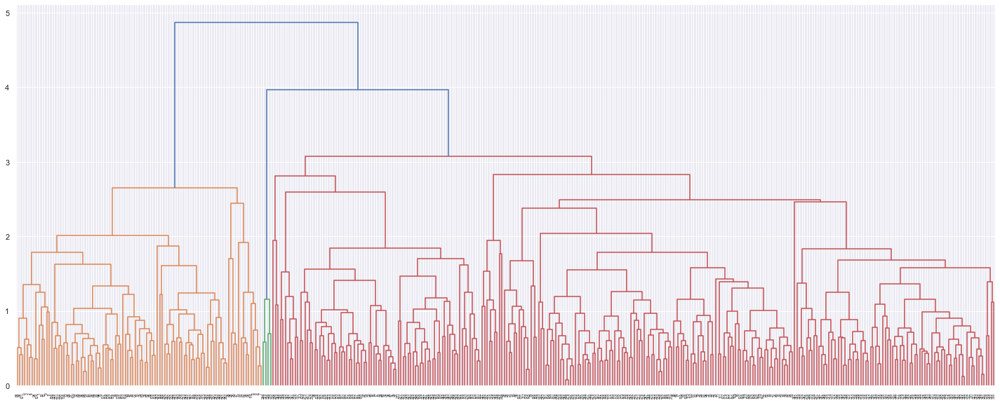

In [32]:
#plotting the H-cluster
plt.figure(figsize=(25, 10))
dendrogram(link_method)
plt.show()

Appears to be to much of a visual clutter, we'll go ahead and cut down the dendrogram to give us 2 clusters/groups

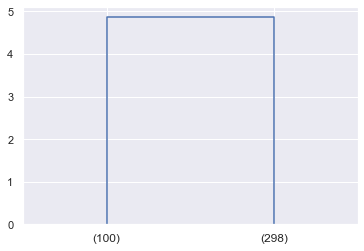

In [33]:
# dendrogram function to arrive at dendrogram
dendrogram(
    link_method,
    truncate_mode='lastp',  
    p=2,  
)
plt.show()

In [34]:
#vieweing the clusters formed
clusters = fcluster(link_method, 2, criterion='maxclust')
clusters

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1,
       1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,

In [35]:
#Attaching the Clusters formed to the Scaled Data
cc_z['clusters_H'] = clusters
cc_z.head()

,cyl,yr,mpg,disp,hp,wt,acc,clusters_H
0,1.498191,-1.627426,-0.706439,1.090604,0.673118,0.630870,-1.295498,1
1,1.498191,-1.627426,-1.090751,1.503514,1.589958,0.854333,-1.477038,1
2,1.498191,-1.627426,-0.706439,1.196232,1.197027,0.550470,-1.658577,1
3,1.498191,-1.627426,-0.962647,1.061796,1.197027,0.546923,-1.295498,1
4,1.498191,-1.627426,-0.834543,1.042591,0.935072,0.565841,-1.840117,1


In [36]:
#Vieweing the Distribution of Clusters
cc_z.clusters_H.value_counts().sort_index()

1    100
2    298
Name: clusters_H, dtype: int64

In [37]:
#Attaching the Clusters formed to the Original Data
cc['clusters_H']=clusters
carH['clusters_H']=clusters
cc.head()

,cyl,yr,mpg,disp,hp,wt,acc,clusters_H
0,8,70,18.0,307.0,130.0,3504,12.0,1
1,8,70,15.0,350.0,165.0,3693,11.5,1
2,8,70,18.0,318.0,150.0,3436,11.0,1
3,8,70,16.0,304.0,150.0,3433,12.0,1
4,8,70,17.0,302.0,140.0,3449,10.5,1


In [38]:
#Create a New Data Set named Hclus
Hclus=cc
Hclus.head()

,cyl,yr,mpg,disp,hp,wt,acc,clusters_H
0,8,70,18.0,307.0,130.0,3504,12.0,1
1,8,70,15.0,350.0,165.0,3693,11.5,1
2,8,70,18.0,318.0,150.0,3436,11.0,1
3,8,70,16.0,304.0,150.0,3433,12.0,1
4,8,70,17.0,302.0,140.0,3449,10.5,1


In [39]:
#Aggregating the Numerical Variable with the Clusters formed with the Mean
aggdata=cc.iloc[:,0:8].groupby('clusters_H').mean()
aggdata['Freq']=cc.clusters_H.value_counts().sort_index()
aggdata

,cyl,yr,mpg,disp,hp,wt,acc,Freq
clusters_H,,,,,,,,
1,7.980000,73.740000,14.684000,345.470000,160.400000,4121.560000,12.702000,100
2,4.607383,76.771812,26.477852,142.404362,85.479866,2584.137584,16.529866,298


Clearly shows two disting group with a difference in average between the clusters and variables

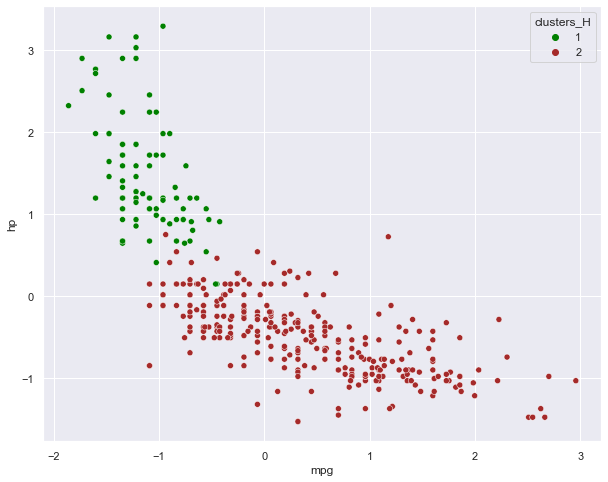

In [40]:
#Plotting the Clusters formed
plt.figure(figsize=(10, 8))
sns.scatterplot(x="mpg", y="hp", hue="clusters_H",
              data=cc_z, 
                    palette=['green','brown']);


## K-Means Clustering

In [41]:
#Seperating the Numeric Values
cc = car.iloc[:,0:7] 
cc_z1 = cc.apply(zscore)
cc_z1.head()

,cyl,yr,mpg,disp,hp,wt,acc
0,1.498191,-1.627426,-0.706439,1.090604,0.673118,0.630870,-1.295498
1,1.498191,-1.627426,-1.090751,1.503514,1.589958,0.854333,-1.477038
2,1.498191,-1.627426,-0.706439,1.196232,1.197027,0.550470,-1.658577
3,1.498191,-1.627426,-0.962647,1.061796,1.197027,0.546923,-1.295498
4,1.498191,-1.627426,-0.834543,1.042591,0.935072,0.565841,-1.840117


In [42]:
#Calculating the within Sum of Squares
wss =[] 
for i in range(1,5):
    KM = KMeans(n_clusters=i)
    KM.fit(cc_z1)
    wss.append(KM.inertia_)
wss

[2785.9999999999995, 1294.8418950727323, 946.019790855379, 738.3923281527318]

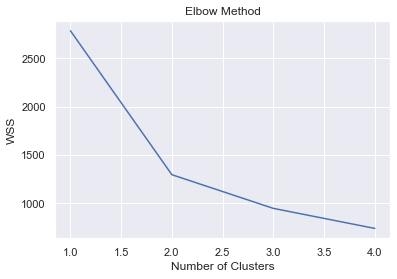

In [43]:
#Plotting the WSS against the Number of Cluster to come up with Optimal Number of Clusters using Elbow-Method
plt.plot(range(1,5), wss);
plt.title('Elbow Method');
plt.xlabel("Number of Clusters")
plt.ylabel("WSS");

In [44]:
#Using 2 Centroids for Clustering
k_means = KMeans(n_clusters = 2)
k_means.fit(cc_z1)
labels = k_means.labels_

In [45]:
# Calculating Silhouette_Score
silhouette_score(cc_z1,labels)

0.48235946103916116

In [46]:
#Calculating Silhouette Score for different Centroids
kmeans_kwargs = {
   "init": "random",
   "n_init": 10,
   "max_iter": 300,
   "random_state": 42,
}


silhouette_coefficients = []

 # Notice you start at 2 Clusters for Silhouette Coefficient
for k in range(2, 7):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(cc_z1)
    score = silhouette_score(cc_z1,kmeans.labels_)
    silhouette_coefficients.append(score)
    

 

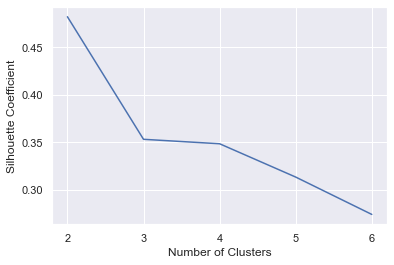

In [47]:
#Plotting Silhouette Score for Different Centroids
plt.plot(range(2, 7), silhouette_coefficients)
plt.xticks(range(2, 7))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [48]:
#Attaching the Labels to the Datasets
cc["cluster_K"] = labels
carK['cluster_K']=labels
Kclus=cc
Kclus.head()

,cyl,yr,mpg,disp,hp,wt,acc,cluster_K
0,8,70,18.0,307.0,130.0,3504,12.0,1
1,8,70,15.0,350.0,165.0,3693,11.5,1
2,8,70,18.0,318.0,150.0,3436,11.0,1
3,8,70,16.0,304.0,150.0,3433,12.0,1
4,8,70,17.0,302.0,140.0,3449,10.5,1


In [49]:
#Vieweing the Distribution of Clusters
cc.cluster_K.value_counts().sort_index()

0    293
1    105
Name: cluster_K, dtype: int64

In [50]:
#Attaching the Clsuters to the Scaled Data
cc_z1["cluster_K"] = labels
cc_z1.head()

,cyl,yr,mpg,disp,hp,wt,acc,cluster_K
0,1.498191,-1.627426,-0.706439,1.090604,0.673118,0.630870,-1.295498,1
1,1.498191,-1.627426,-1.090751,1.503514,1.589958,0.854333,-1.477038,1
2,1.498191,-1.627426,-0.706439,1.196232,1.197027,0.550470,-1.658577,1
3,1.498191,-1.627426,-0.962647,1.061796,1.197027,0.546923,-1.295498,1
4,1.498191,-1.627426,-0.834543,1.042591,0.935072,0.565841,-1.840117,1


In [51]:
#Aggregating the Numerical Variable with the Clusters formed with the Mean
aggdata=cc.iloc[:,0:8].groupby('cluster_K').mean()
aggdata['Freq']=cc.cluster_K.value_counts().sort_index()
aggdata

,cyl,yr,mpg,disp,hp,wt,acc,Freq
cluster_K,,,,,,,,
0,4.569966,76.822526,26.619113,140.250853,85.061433,2567.860068,16.535836,293
1,7.923810,73.742857,14.851429,341.809524,158.000000,4093.771429,12.867619,105


Clearly shows two disting group with a difference in average between the clusters and variables

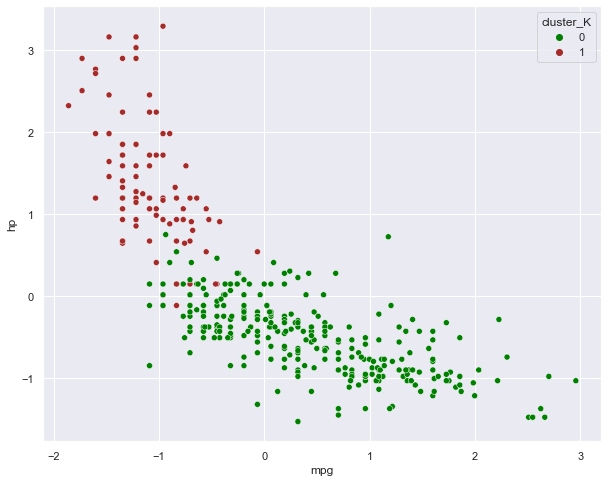

In [52]:
#Plotting the Clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x="mpg", y="hp", hue="cluster_K",
              data=cc_z1, 
                    palette=['green','brown']);

In [53]:
carH.clusters_H.value_counts().sort_index()

1    100
2    298
Name: clusters_H, dtype: int64

In [54]:
carK.cluster_K.value_counts().sort_index()

0    293
1    105
Name: cluster_K, dtype: int64

In [55]:
carH.shape

(398, 14)

In [56]:
carK.shape

(398, 14)

In [57]:
car.head()

,cyl,yr,mpg,disp,hp,wt,acc,origin_america,origin_asia,origin_europe,mpg_level_high,mpg_level_low,mpg_level_medium
0,8,70,18.0,307.0,130.0,3504,12.0,1,0,0,0,0,1
1,8,70,15.0,350.0,165.0,3693,11.5,1,0,0,0,1,0
2,8,70,18.0,318.0,150.0,3436,11.0,1,0,0,0,0,1
3,8,70,16.0,304.0,150.0,3433,12.0,1,0,0,0,1,0
4,8,70,17.0,302.0,140.0,3449,10.5,1,0,0,0,0,1


## Linear Regression on the Original Dataset

In [58]:
X = car.drop(['mpg','origin_europe','mpg_level_low'], axis=1)
# the dependent variable
y = car[['mpg']]

In [59]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=15)

In [60]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [61]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for cyl is -0.5134441386218958
The coefficient for yr is 0.4434650429116838
The coefficient for disp is 0.010688858394646991
The coefficient for hp is 0.01031551453631408
The coefficient for wt is -0.004538788568737143
The coefficient for acc is 0.19183425608862567
The coefficient for origin_america is -1.7306209513688977
The coefficient for origin_asia is -0.8976724344009372
The coefficient for mpg_level_high is 8.552374663817025
The coefficient for mpg_level_medium is 1.594121869485044


In [62]:
intercept = regression_model.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is -1.6635717568651067


In [63]:
regression_model.score(X_train, y_train)

0.8967703023839787

In [64]:
O=regression_model.score(X_test, y_test)
O

0.9037421476349176

## Linear Regression on Data with K Means Cluster

In [65]:
#Renaming the Cluster Labels to Light and Heavy vehicles and Creating Dummy Variables of it
carK['cluster_K']=carK['cluster_K'].astype('category')
carK['cluster_K'] = carK['cluster_K'].replace({1: 'heavy', 0: 'light'})
carK = pd.get_dummies(carK, columns=['cluster_K'])

In [66]:
carK.head()

,cyl,yr,mpg,disp,hp,wt,acc,origin_america,origin_asia,origin_europe,mpg_level_high,mpg_level_low,mpg_level_medium,cluster_K_heavy,cluster_K_light
0,8,70,18.0,307.0,130.0,3504,12.0,1,0,0,0,0,1,1,0
1,8,70,15.0,350.0,165.0,3693,11.5,1,0,0,0,1,0,1,0
2,8,70,18.0,318.0,150.0,3436,11.0,1,0,0,0,0,1,1,0
3,8,70,16.0,304.0,150.0,3433,12.0,1,0,0,0,1,0,1,0
4,8,70,17.0,302.0,140.0,3449,10.5,1,0,0,0,0,1,1,0


In [67]:
X = carK.drop(['mpg','origin_europe','mpg_level_low','cluster_K_light'], axis=1)
# the dependent variable
y = carK[['mpg']]

In [68]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=10)

In [69]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [70]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for cyl is -0.8992832176313688
The coefficient for yr is 0.4532387301678836
The coefficient for disp is 0.013997478314411015
The coefficient for hp is -0.01018774752088055
The coefficient for wt is -0.004285603995834468
The coefficient for acc is 0.11608057062270899
The coefficient for origin_america is -2.137414988498734
The coefficient for origin_asia is -1.4198175224115046
The coefficient for mpg_level_high is 8.449031853125827
The coefficient for mpg_level_medium is 1.4954579434955357
The coefficient for cluster_K_heavy is 1.513133885479094


In [71]:
intercept = regression_model.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is 1.7771332604529952


In [72]:
regression_model.score(X_train, y_train)

0.8980370287533831

In [73]:
K=regression_model.score(X_test, y_test)
K

0.9030219284955012

## Linear Regression on Data with H-Clusters

In [74]:
#Renaming the Cluster Labels to Light and Heavy Vehicles and Creating Dummy Variable of it
carH['clusters_H']=carH['clusters_H'].astype('category')
carH['clusters_H'] = carH['clusters_H'].replace({1: 'heavy', 2: 'light'})
carH = pd.get_dummies(carH, columns=['clusters_H'])

In [75]:
X = carH.drop(['mpg','origin_europe','mpg_level_low','clusters_H_light'], axis=1)
# the dependent variable
y = carH[['mpg']]

In [76]:
# Split X and y into Training and Test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=12)

In [77]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [78]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for cyl is -1.204870491239901
The coefficient for yr is 0.4264508065234452
The coefficient for disp is 0.018573356343030208
The coefficient for hp is -0.011988055516049048
The coefficient for wt is -0.004067228102238307
The coefficient for acc is 0.18417507769484742
The coefficient for origin_america is -1.68728127478423
The coefficient for origin_asia is -0.7294614751756149
The coefficient for mpg_level_high is 9.330669482931919
The coefficient for mpg_level_medium is 2.296692036659149
The coefficient for clusters_H_heavy is 2.501367430196733


In [79]:
intercept = regression_model.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is 1.661161693546152


In [80]:
regression_model.score(X_train, y_train)

0.8940352995292054

In [81]:
H=regression_model.score(X_test, y_test)
H

0.9131358716387639

In [82]:
modellists = []
modellists.append(['Linear Regression on Original Data set', O*100])
modellists.append(['Linear Regression with K means clusters', K*100])
modellists.append(['Linear Regression with Heirarchical clusters', H*100])
mdl_df = pd.DataFrame(modellists, columns = ['Model','r^2 on Test'])
mdl_df

,Model,r^2 on Test
0,Linear Regression on Original Data set,90.374215
1,Linear Regression with K means clusters,90.302193
2,Linear Regression with Heirarchical clusters,91.313587


## Summary
1. K-means appears to explain the highest variation in the datset, but with a difference of only 1% when compared with other models, to get more clarity a larger dataset may be used, since this is a dataset of used cars it doesn't give us how many previous owners has the cars seen which might be helful variable,the gender of the previous owners, the reason/purpose that the cars were being used is also an important factor which the dataset doen't capture. 

2. With the above mentioned features it may be possible to get a higher accuracy or explainability of the models and its variables.

3. Linear Regression with K Means clusters gives us 91 % accuracy 

4. Linear Regression with Hirerachial Clusters givs us 90 % accuracy 

5. Both models perform well

In [83]:
# Part1 - Big 5V's

## Volume
### Description:
Volume is the base in the Big Data 5V's if we see it as a Pyramid. The volume of data that companies manage skyrocketed around 2012, when they began collecting more than three million pieces of data every data. “Since then, this volume doubles about every 40 months

### Observation:
1. The Volume of this data set is very small. We have 9 features of information in this dataset. 
2. The dataset has 9 Columns X 398 Rows of data

### Recommendation:
1. The dataset could have had more volume in terms of both features and size of the dataset
2. To predict the mpg with a limited data might not necessarily yield a right prediction

## Velocity:
### Description:
Velocity is termed as the flow of information as quickly – as close to real-time as possible. Velocity can be more important than volume because it can give us a bigger competitive advantage. Sometimes it’s better to have limited data in real time than lots of data at a low speed.

### Observation:
1. The dataset has a limited information and depending upon the age of the data we can conclude that it is pretty old
2. The dataset isn't a realtime data as the feature Yr of manufature seems the data belongs to the year 70-82

### Recommendation:
1. To Predict the mpg the source of the data could have been realtime

## Variety:
### Description:
Variety is defined as the collection of data from many different sources: from in-house devices to smartphone GPS technology or what people are saying on social networks. The importance of these sources of information varies depending on the nature of the business. For example, a mass-market service or product should be more aware of social networks than an industrial business.

### Observation:
The dataset has limited variety of information
A) mpg: continuous
B) cylinders: multi-valued discrete
C) displacement: continuous
D) horsepower: continuous
E) weight: continuous
F) acceleration: continuous
G) model year: multi-valued discrete
H)origin: multi-valued discrete
I) car name: string (unique for each instance)

### Recommendation:
To improve the variety of data some additional information like the below could have been sourced
A) transmission type
B) Fuel type  
C) Service history

## Veracity:
### Description:
Veracity is equivalent to quality. We have all the data, but could we be missing something? Are the data “clean” and accurate? Do they really have something to offer?

### Observation:
1. The dataset has 9 features of which 8 features are either float64 or int64 whislt only one feature is a object data type
2. We observe lot of inconsistencies in the car names which needs to be cleaned up before we perform EDA

### Recommendation:
1. The car names shall be standardized whilst sourcing the data as we have only specific models in the market
2. Special characters shall be eliminated in the car names and shall be replaced with a space " "

## Value:
Value sits at the top of the big data pyramid. This refers to the ability to transform a tsunami of data into business.

### Description:
With the limited information provided in the dataset it's difficult to interprete the values into meaningful predicitions

### Recommendation:
1. Mpg is the desired variable in this dataset which needs to be predicted with the other discrete variables like Cycliners, displacement, hp, wt etc. 
2. We could have had meaningful predictions if the volume of data is increased and the additional variety of data like transmission type, Fuel type, Service historyis provided would have been provided

## QED

## DOMAIN: 
Manufacturing
### CONTEXT:
Company X curates and packages wine across various vineyards spread throughout the country.
### DATA DESCRIPTION:
The data concerns the chemical composition of the wine and its respective quality.
### Attribute Information:
1. A, B, C, D: specific chemical composition measure of the wine 
2. Quality: quality of wine [ Low and High ] 

### PROJECT OBJECTIVE:
Goal is to build a synthetic data generation model using the existing data provided by the company.
Steps and tasks: [ Total Score: 5 points]
1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data

In [84]:
#Loading the required packages
import numpy as np   
import pandas as pd    
import matplotlib.pyplot as plt 
from scipy.stats import zscore
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
import seaborn as sns
%matplotlib inline 
sns.set(color_codes=True)
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

In [86]:
#importing the data
wine=pd.ExcelFile('Part2 - Company.xlsx',engine='openpyxl')
wine.sheet_names
wine = wine.parse("Sheet1")
wine.head()

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [87]:
row, column = wine.shape
print('The dataset contains', row, 'rows and', column, 'columns')

The dataset contains 61 rows and 5 columns


In [88]:
#make a copy of the data
wine1=wine.copy()

In [89]:
#dropping the target variable
wine=wine.drop('Quality',axis=1)

In [90]:
#checking for data types
print('The data type of each attribute: \n')
wine1.info()

The data type of each attribute: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


In [91]:
print('The Target Variable has set 18 missing values \n')
wine1.isnull().sum()

The Target Variable has set 18 missing values 



A           0
B           0
C           0
D           0
Quality    18
dtype: int64

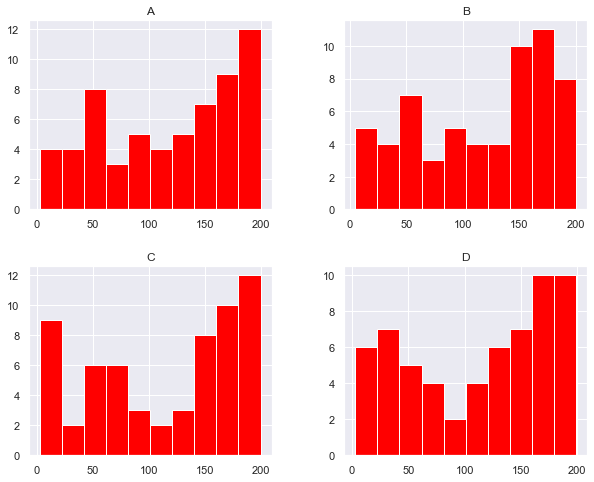

In [92]:
#checking the distribution of the data points
wine.hist(bins = 10, figsize = (10, 8), color = 'red')
plt.show()

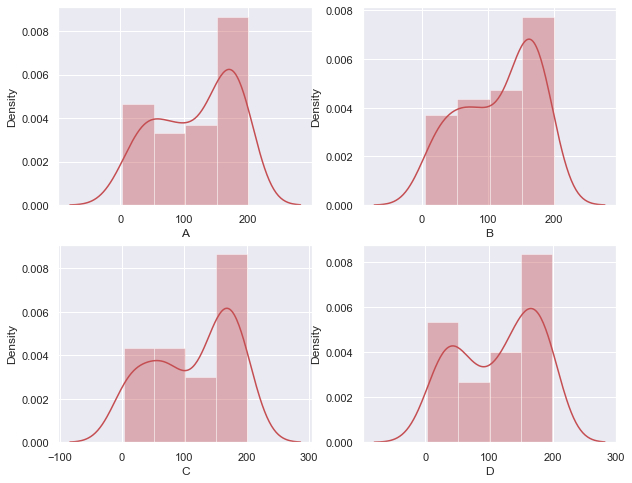

In [93]:
#checking for the density of the variable
plt.figure(figsize=(10, 8))
col = 1
for i in wine.columns:
    plt.subplot(2, 2, col)
    sns.distplot(wine[i], color = 'r')
    col += 1 

the chemical compositions are on the same scales between 0 to 200

In [94]:
#scaling the numeric variables
w1 = wine.apply(zscore)
w1.head()

,A,B,C,D
0,-1.168034,-1.561080,-1.061569,-0.103138
1,0.904992,0.284923,0.306077,0.823013
2,0.660147,0.807376,0.321443,0.264129
3,-0.939512,-1.630740,-1.706975,-1.125099
4,-0.972158,-0.986381,-1.614775,-0.741864


In [95]:
#checking for the distribution of the targrt variables
wine1['Quality'].value_counts()

Quality A    26
Quality B    17
Name: Quality, dtype: int64

In [96]:
#applying kmeans with 2 centroids
k_means = KMeans(n_clusters = 2)
k_means.fit(w1)
labels = k_means.labels_

In [97]:
# Calculating silhouette_score
silhouette_score(w1,labels)

0.6891674125195145

In [98]:
#attaching the cluster labels to the original dataset
wine1["Quality_k"] = labels

In [99]:
#checking for the first 15 observations
wine1.head(15)

,A,B,C,D,Quality,Quality_k
0,47,27,45,108,Quality A,0
1,174,133,134,166,Quality B,1
2,159,163,135,131,NaN,1
3,61,23,3,44,Quality A,0
4,59,60,9,68,Quality A,0
5,153,140,154,199,NaN,1
6,34,28,78,22,Quality A,0
7,191,144,143,154,NaN,1
8,160,181,194,178,Quality B,1
9,145,178,158,141,NaN,1


In [100]:
#renaming the cluster labels
wine1['Quality_k'] = wine1['Quality_k'].replace({0: 'Quality A', 1: 'Quality B'})

In [101]:
#checking for datatypes
wine1.dtypes

A             int64
B             int64
C             int64
D             int64
Quality      object
Quality_k    object
dtype: object

In [102]:
#dropping na rows
wn=wine1.dropna()

In [103]:
#checking for the shape
wn.shape

(43, 6)

In [104]:
#using the cluster labels and actual target labels to check for accuracy
pred = wn['Quality_k']
actual=wn['Quality']

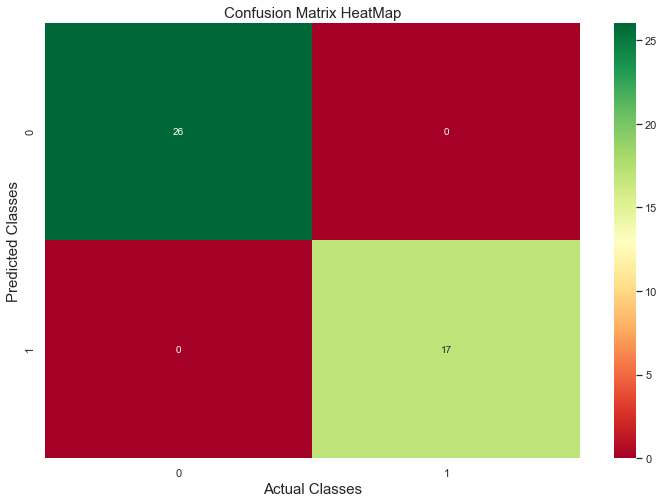

In [105]:
#visualization of confusion matrix in the form of a heatmap
cm= confusion_matrix(actual, pred)
plt.figure(figsize = (12, 8))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.xlabel('Actual Classes', fontsize = 15)
plt.ylabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix HeatMap', fontsize = 15);

There appears to be no misclassification when checking the it with the non missing target variables and the predicted clusters,
Hence the new labels can be used as a target variable

# Part 3

In [106]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import zscore
import warnings
warnings.filterwarnings('ignore')

# 1. Observe dataset

In [107]:
data = pd.read_csv('Part3 - vehicle.csv')
data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [108]:
data.shape

(846, 19)

In [109]:
data.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

There are many missing values. We will choose to impute these null values instead of dropping them.

In [110]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [111]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

There are few null values in almost every column,we will try to impute this with mean value this would slightly bias the dataset but won't impact the model significantly.  

In [112]:
data.fillna(data.mean(), axis = 0, inplace = True)
print(data.isnull().sum())
print(data.shape)

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64
(846, 19)


We have imputed all the rows with their mean values.

In [113]:
#class is target column
data.groupby('class').count()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218
car,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429
van,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199


There is a data imbalance as car has a significantly higher count as compared to bus and van. While van has the lowest count.

<Figure size 1080x1080 with 0 Axes>

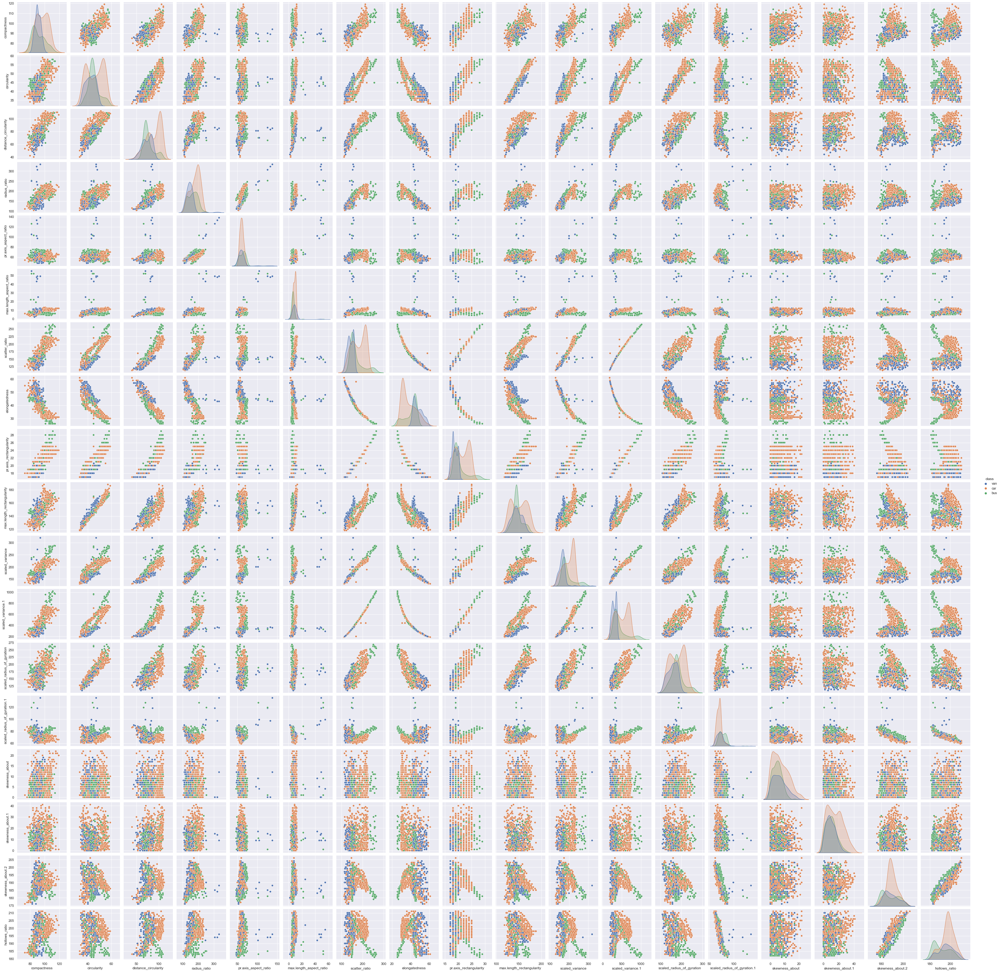

In [114]:
plt.figure(figsize = (15,15))
sns.pairplot(data = data, diag_kind = 'kde', hue = 'class')

Most of these columns share a strong correlation with each other. We can also notice certain outliers in this data. 

# 2.EDA

Let's analyze every column in detail.

## 2.1 Compactness

Text(0.5, 1.0, 'Box Plot')

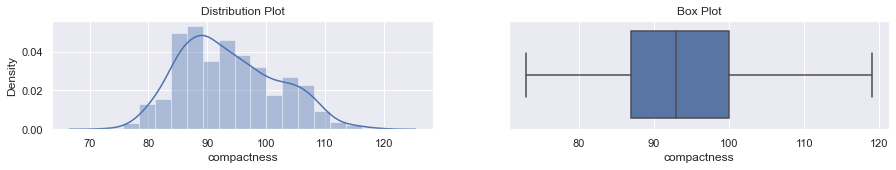

In [115]:
fig, (g1, g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['compactness'], ax = g1)
g1.set_title('Distribution Plot')

sns.boxplot(data['compactness'], ax = g2)
g2.set_title('Box Plot')

Compactness column shows an approximately normal distribution curve while having no outliers.

## 2.2 Circularity

Text(0.5, 1.0, 'Box Plot')

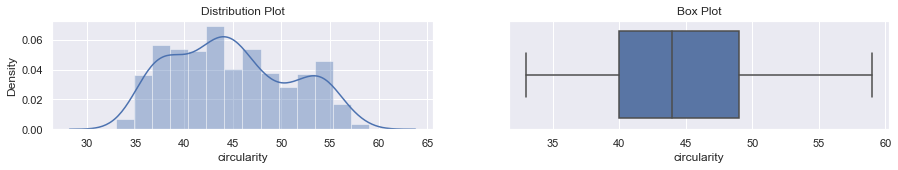

In [116]:
fig, (g1, g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['circularity'], ax = g1)
g1.set_title('Distribution Plot')

sns.boxplot(data['circularity'], ax = g2)
g2.set_title('Box Plot')

The distribution plot has 3 peaks and is right skewed.

## 2.3 Distance Circularity 

Text(0.5, 1.0, 'Box Plot')

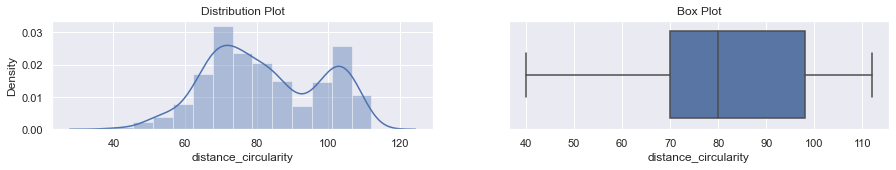

In [117]:
fig, (g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['distance_circularity'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['distance_circularity'], ax = g2)
g2.set_title("Box Plot")

Here the distribution plot has 2 peaks and is left skewed

## 2.4 Radius Ratio

Text(0.5, 1.0, 'Box Plot')

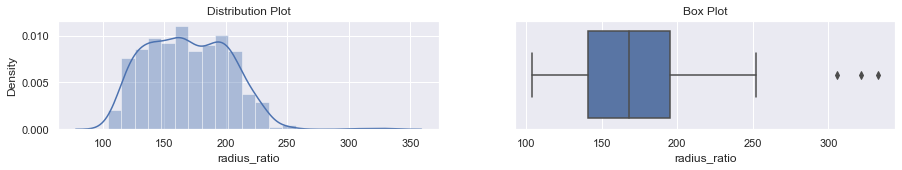

In [118]:
fig, (g1, g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['radius_ratio'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['radius_ratio'], ax = g2)
g2.set_title("Box Plot")

Here it is right skewed and there is presence of outliers.

### Performing outlier analysis

In [119]:
q1 = np.quantile(data['radius_ratio'], 0.25)
q2 = np.quantile(data['radius_ratio'], 0.50)
q3 = np.quantile(data['radius_ratio'], 0.75)
IQR = q3 - q1
#outlier = q1 - 1.5*IQR and q3 + 1.5*IQR... here as outliers are in the 4th quartile hence using 2 formula
#Printing the quartile

print("Quartile q1: ", q1)
print("Quartile q2: ", q2)
print("Quartile q3: ", q3)
print("Inter Quartile Range: ", IQR)

print("radius_ratio above ", data['radius_ratio'].quantile(0.75) + (1.5*IQR), "are outliers")
print("No. of outliers ", data[data['radius_ratio'] > 276]['radius_ratio'].shape[0])


Quartile q1:  141.0
Quartile q2:  168.0
Quartile q3:  195.0
Inter Quartile Range:  54.0
radius_ratio above  276.0 are outliers
No. of outliers  3


## 2.5 Pr.Axis aspect ratio

Text(0.5, 1.0, 'Box Plot')

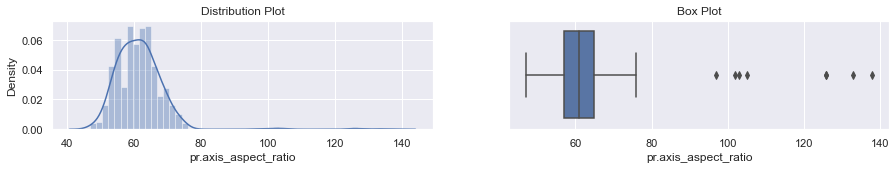

In [120]:
fig, (g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['pr.axis_aspect_ratio'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['pr.axis_aspect_ratio'], ax = g2)
g2.set_title("Box Plot")

The distribution is approx normally distributed as well as right skewed and there is presence of outliers.

In [121]:
#Performing Outlier analysis

q1 = np.quantile(data['pr.axis_aspect_ratio'], 0.25)
q2 = np.quantile(data['pr.axis_aspect_ratio'], 0.50)
q3 = np.quantile(data['pr.axis_aspect_ratio'], 0.75)
IQR = q3 - q1
#outlier = q1 - 1.5*IQR and q3 + 1.5*IQR... here as outliers are in the 4th quartile hence using 2 formula
#Printing the quartile

print("Quartile q1: ", q1)
print("Quartile q2: ", q2)
print("Quartile q3: ", q3)
print("Inter Quartile Range: ", IQR)

print("pr.axis_aspect_ratio above ", data['pr.axis_aspect_ratio'].quantile(0.75) + (1.5*IQR), "are outliers")
print("No. of outliers ", data[data['pr.axis_aspect_ratio'] > 77.0]['pr.axis_aspect_ratio'].shape[0])

Quartile q1:  57.0
Quartile q2:  61.0
Quartile q3:  65.0
Inter Quartile Range:  8.0
pr.axis_aspect_ratio above  77.0 are outliers
No. of outliers  8


## 2.6 Max length aspect ratio

Text(0.5, 1.0, 'Box Plot')

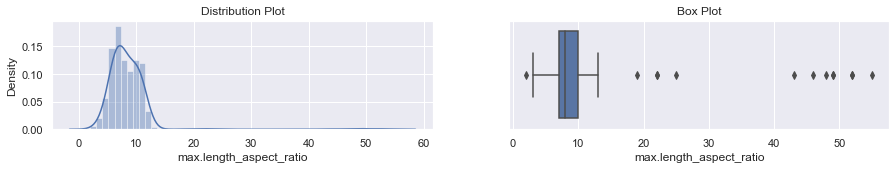

In [122]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['max.length_aspect_ratio'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['max.length_aspect_ratio'], ax = g2)
g2.set_title("Box Plot")

There are 2 peaks and significant no. of outliers are observed.

In [123]:
#Performing Outlier analysis

q1 = np.quantile(data['max.length_aspect_ratio'], 0.25)
q2 = np.quantile(data['max.length_aspect_ratio'], 0.50)
q3 = np.quantile(data['max.length_aspect_ratio'], 0.75)
IQR = q3 - q1
#outlier = q1 - 1.5*IQR and q3 + 1.5*IQR... here as outliers are in the 4th quartile hence using 2 formula
#Printing the quartile

print("Quartile q1: ", q1)
print("Quartile q2: ", q2)
print("Quartile q3: ", q3)
print("Inter Quartile Range: ", IQR)

print("max.length_aspect_ratio above ", data['max.length_aspect_ratio'].quantile(0.75) + (1.5*IQR), "are outliers")
print("max.length_aspect_ratio below ", data['max.length_aspect_ratio'].quantile(0.25) - (1.5*IQR), "are outliers")

print("No. of outliers above  are",data[data['max.length_aspect_ratio']>14.5]['max.length_aspect_ratio'].shape[0])
print("No. of outliers below are",data[data['max.length_aspect_ratio']<2.5]['max.length_aspect_ratio'].shape[0])

Quartile q1:  7.0
Quartile q2:  8.0
Quartile q3:  10.0
Inter Quartile Range:  3.0
max.length_aspect_ratio above  14.5 are outliers
max.length_aspect_ratio below  2.5 are outliers
No. of outliers above  are 12
No. of outliers below are 1


## 2.7 Scatter ratio

Text(0.5, 1.0, 'Box Plot')

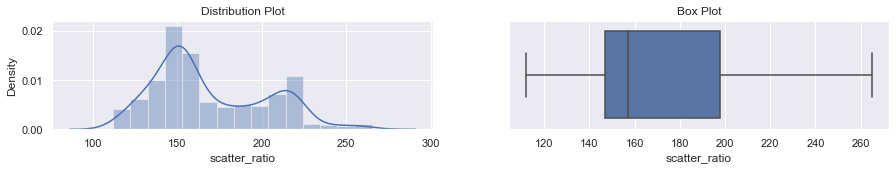

In [124]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['scatter_ratio'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['scatter_ratio'], ax = g2)
g2.set_title("Box Plot")

There are 2 peaks observed and the distribution is right skewed.

## 2.8 Elongatedness

Text(0.5, 1.0, 'Box Plot')

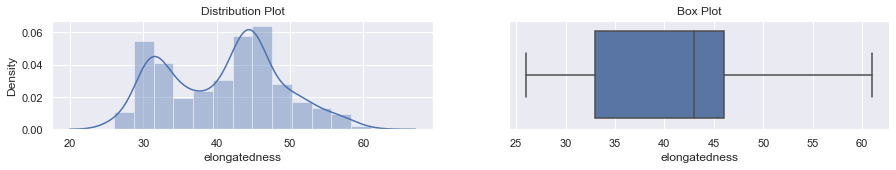

In [125]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['elongatedness'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['elongatedness'], ax = g2)
g2.set_title("Box Plot")

There are 2 peaks observed and the distribution is left skewed.

## 2.9 Pr.Axis rectangularity

Text(0.5, 1.0, 'Box Plot')

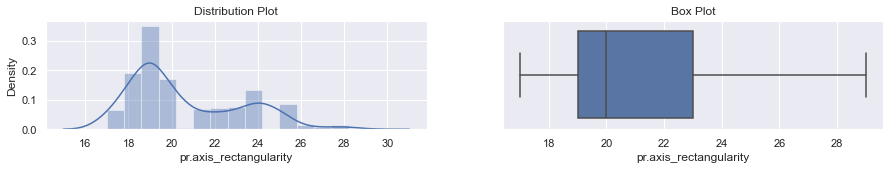

In [126]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['pr.axis_rectangularity'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['pr.axis_rectangularity'], ax = g2)
g2.set_title("Box Plot")

There are 2 peaks observed and the distribution is right skewed.

## 2.10 Max length rectangularity

Text(0.5, 1.0, 'Box Plot')

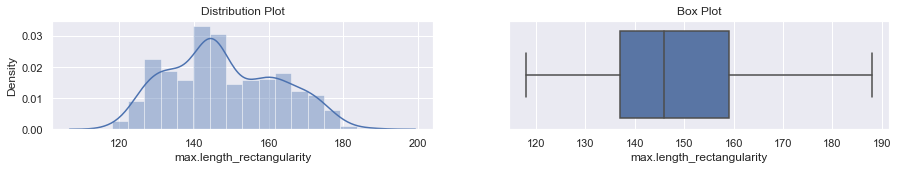

In [127]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['max.length_rectangularity'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['max.length_rectangularity'], ax = g2)
g2.set_title("Box Plot")

There are 3 peaks observed and no outliers in the data.

## 2.11 Scaled variance

Text(0.5, 1.0, 'Box Plot')

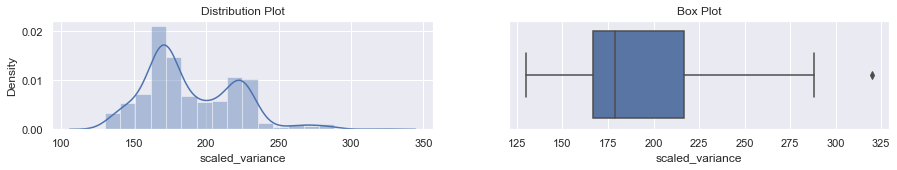

In [128]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['scaled_variance'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['scaled_variance'], ax = g2)
g2.set_title("Box Plot")

In [129]:
#Performing Outlier analysis

q1 = np.quantile(data['scaled_variance'], 0.25)
q2 = np.quantile(data['scaled_variance'], 0.50)
q3 = np.quantile(data['scaled_variance'], 0.75)
IQR = q3 - q1
#outlier = q1 - 1.5*IQR and q3 + 1.5*IQR... here as outliers are in the 4th quartile hence using 2nd formula
#Printing the quartile

print("Quartile q1: ", q1)
print("Quartile q2: ", q2)
print("Quartile q3: ", q3)
print("Inter Quartile Range: ", IQR)

print("scaled_variance above ", data['scaled_variance'].quantile(0.75) + (1.5*IQR), "are outliers")
print("No. of outliers ", data[data['scaled_variance'] > 292]['scaled_variance'].shape[0])

Quartile q1:  167.0
Quartile q2:  179.0
Quartile q3:  217.0
Inter Quartile Range:  50.0
scaled_variance above  292.0 are outliers
No. of outliers  1


## 2.12 Scaled variance.1

Text(0.5, 1.0, 'Box Plot')

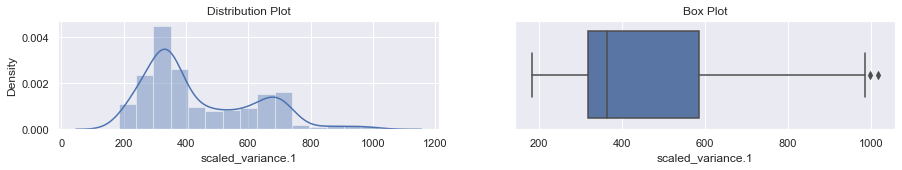

In [130]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['scaled_variance.1'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['scaled_variance.1'], ax = g2)
g2.set_title("Box Plot")

The distribution plot shows 2 peaks with outliers.

In [131]:
#Performing Outlier analysis

q1 = np.quantile(data['scaled_variance.1'], 0.25)
q2 = np.quantile(data['scaled_variance.1'], 0.50)
q3 = np.quantile(data['scaled_variance.1'], 0.75)
IQR = q3 - q1
#outlier = q1 - 1.5*IQR and q3 + 1.5*IQR... here as outliers are in the 4th quartile hence using 2 formula
#Printing the quartile

print("Quartile q1: ", q1)
print("Quartile q2: ", q2)
print("Quartile q3: ", q3)
print("Inter Quartile Range: ", IQR)

print("scaled variance.1 above ", data['scaled_variance.1'].quantile(0.75) + (1.5*IQR), "are outliers")
print("No. of outliers ", data[data['scaled_variance.1'] > 989.5]['scaled_variance.1'].shape[0])

Quartile q1:  318.25
Quartile q2:  364.0
Quartile q3:  586.75
Inter Quartile Range:  268.5
scaled variance.1 above  989.5 are outliers
No. of outliers  2


## 2.13 Scaled radius of gyration

Text(0.5, 1.0, 'Box Plot')

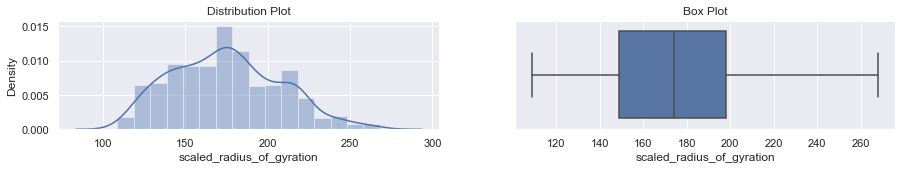

In [132]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['scaled_radius_of_gyration'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['scaled_radius_of_gyration'], ax = g2)
g2.set_title("Box Plot")

It has an approximate normal distribution with no outliers.

## 2.14 Scaled radius of gyration.1

Text(0.5, 1.0, 'Box Plot')

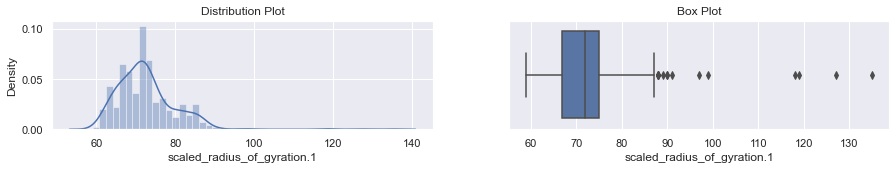

In [133]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['scaled_radius_of_gyration.1'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['scaled_radius_of_gyration.1'], ax = g2)
g2.set_title("Box Plot")

In [134]:
#Performing Outlier analysis

q1 = np.quantile(data['scaled_radius_of_gyration.1'], 0.25)
q2 = np.quantile(data['scaled_radius_of_gyration.1'], 0.50)
q3 = np.quantile(data['scaled_radius_of_gyration.1'], 0.75)
IQR = q3 - q1
#outlier = q1 - 1.5*IQR and q3 + 1.5*IQR... here as outliers are in the 4th quartile hence using 2 formula
#Printing the quartile

print("Quartile q1: ", q1)
print("Quartile q2: ", q2)
print("Quartile q3: ", q3)
print("Inter Quartile Range: ", IQR)

print("scaled radius of gyration.1 above ", data['scaled_radius_of_gyration.1'].quantile(0.75) + (1.5*IQR), "are outliers")
print("No. of outliers ", data[data['scaled_radius_of_gyration.1'] > 87]['scaled_radius_of_gyration.1'].shape[0])

Quartile q1:  67.0
Quartile q2:  72.0
Quartile q3:  75.0
Inter Quartile Range:  8.0
scaled radius of gyration.1 above  87.0 are outliers
No. of outliers  15


## 2.15 Skewness about

Text(0.5, 1.0, 'Box Plot')

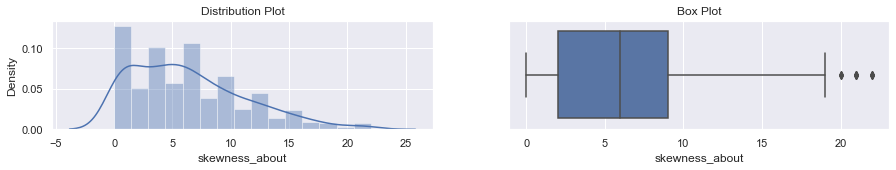

In [135]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['skewness_about'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['skewness_about'], ax = g2)
g2.set_title("Box Plot")

In [136]:
#Performing Outlier analysis

q1 = np.quantile(data['skewness_about'], 0.25)
q2 = np.quantile(data['skewness_about'], 0.50)
q3 = np.quantile(data['skewness_about'], 0.75)
IQR = q3 - q1
#outlier = q1 - 1.5*IQR and q3 + 1.5*IQR... here as outliers are in the 4th quartile hence using 2 formula
#Printing the quartile

print("Quartile q1: ", q1)
print("Quartile q2: ", q2)
print("Quartile q3: ", q3)
print("Inter Quartile Range: ", IQR)

print("skewness_about above ", data['skewness_about'].quantile(0.75) + (1.5*IQR), "are outliers")
print("No. of outliers ", data[data['skewness_about'] > 19.5]['skewness_about'].shape[0])

Quartile q1:  2.0
Quartile q2:  6.0
Quartile q3:  9.0
Inter Quartile Range:  7.0
skewness_about above  19.5 are outliers
No. of outliers  12


## 2.16 Skewness about.1

Text(0.5, 1.0, 'Box Plot')

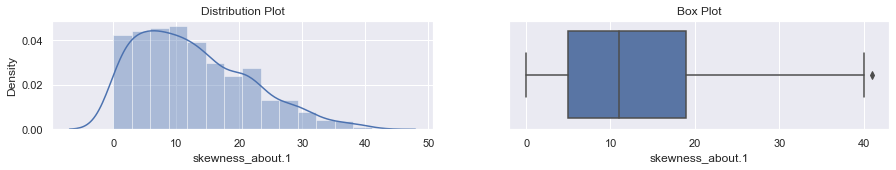

In [137]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['skewness_about.1'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['skewness_about.1'], ax = g2)
g2.set_title("Box Plot")

In [138]:
#Performing Outlier analysis

q1 = np.quantile(data['skewness_about.1'], 0.25)
q2 = np.quantile(data['skewness_about.1'], 0.50)
q3 = np.quantile(data['skewness_about.1'], 0.75)
IQR = q3 - q1
#outlier = q1 - 1.5*IQR and q3 + 1.5*IQR... here as outliers are in the 4th quartile hence using 2 formula
#Printing the quartile

print("Quartile q1: ", q1)
print("Quartile q2: ", q2)
print("Quartile q3: ", q3)
print("Inter Quartile Range: ", IQR)

print("skewness about.1 above ", data['skewness_about.1'].quantile(0.75) + (1.5*IQR), "are outliers")
print("No. of outliers ", data[data['skewness_about.1'] > 40]['skewness_about.1'].shape[0])

Quartile q1:  5.0
Quartile q2:  11.0
Quartile q3:  19.0
Inter Quartile Range:  14.0
skewness about.1 above  40.0 are outliers
No. of outliers  1


## 2.17 Skewness about.2

Text(0.5, 1.0, 'Box Plot')

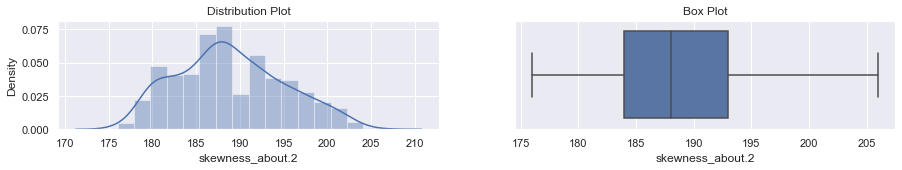

In [139]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['skewness_about.2'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['skewness_about.2'], ax = g2)
g2.set_title("Box Plot")

## 2.18 Hollows ratio

Text(0.5, 1.0, 'Box Plot')

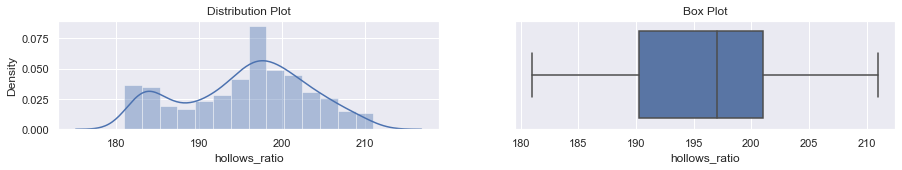

In [140]:
fig,(g1,g2) = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(15,2)
sns.distplot(data['hollows_ratio'], ax = g1)
g1.set_title("Distribution Plot")

sns.boxplot(data['hollows_ratio'], ax = g2)
g2.set_title("Box Plot")

There are 2 peaks observed and no outliers in the data.

## 2.19 Class

In [141]:
data.groupby('class').count()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218
car,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429
van,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199


<AxesSubplot:xlabel='class', ylabel='count'>

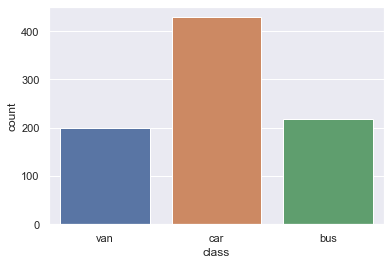

In [142]:
sns.countplot(data['class'])

There is some imbalance in terms of class. This will have some impact on model.

# 3. EDA Summary of Independent and dependent variables

We can infer,

* compactness - Approx normal distribution, no outliers
* circularity - Slightly right skewed
* distance_circularity - Left skewed
* radius_ratio - Approx normal distribution, with 3 outliers
* pr.axis_aspect_ratio - Approx normal distribution, with 8 outliers
* max.length_aspect_ratio - 2 peak, 13 outliers
* scatter_ratio - 2 peaks, right skewed
* elongatedness - 2 peaks, left skewed
* pr.axis_rectangularity - 2 peaks, right skewed
* max.length_rectangularity - 3 peaks, no outliers
* scaled_variance - 2 peaks, 1 outlier
* scaled_variance.1 - 2 peaks, 2 outliers
* scaled_radius_of_gyration - Slightly right skewed
* scaled_radius_of_gyration.1 - 15 Outliers
* skewness_about - right skewed, 12 outliers
* skewness_about.1 - 1 outlier
* skewness_about.2 - No outlier
* hollows_ratio - 2 peaks, no outlier
* class - more no. of car > bus > van


We have chosen to not remove the outliers as the no. of outliers is insignificant and it wouldn't bias the model. However dropping these outliers may give us a better model. Assuming these outliers were artificially introduced during data collection.


## Correlation Matrix

<AxesSubplot:>

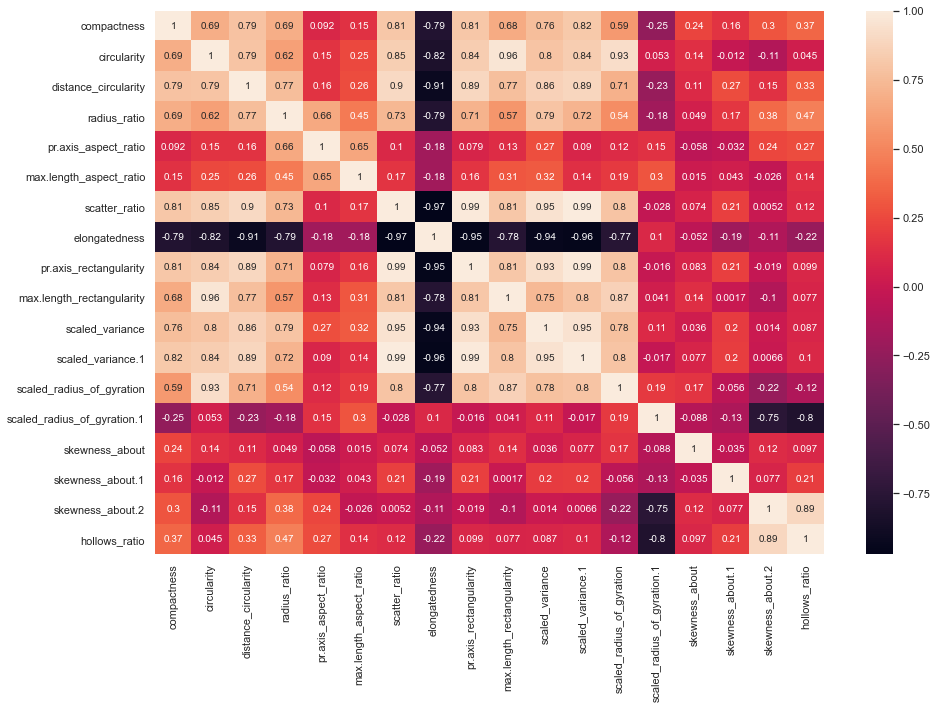

In [143]:
plt.figure(figsize = (15,10))
sns.heatmap(data.corr(), annot = True)

Here there are some columns which share high collinearity while some share low collinearity. We can drop the columns whichever share high collinearity as there's no use in considering multiple columns. We will use Principal Component Analysis to determine which columns can be dropped.

# 4. Principal Component Analysis

In [144]:
#Preparing X independent columns, y dependent columns
data_attr = data.drop('class', axis = 1)
data_target = data['class']

print(data_attr.shape)
print(data_target.shape)

(846, 18)
(846,)


In [145]:
#Scaling the attribute data

data_attr_s = data_attr.apply(zscore)

In [146]:
#Replacing Target column into numbers

data_target.replace({"car": 0, "bus": 1, "van": 2}, inplace = True)

print(data_target.shape)

(846,)


In [147]:
#Applying Covariance matrix

cov_mat = np.cov(data_attr_s, rowvar = False)
print(cov_mat)

[[ 1.00118343  0.68623251  0.79084412  0.69065619  0.09181254  0.14842463
   0.81319623 -0.78957587  0.81459888  0.67694334  0.76367265  0.81686705
   0.58584865 -0.25036693  0.23596607  0.15757316  0.2988797   0.36598446]
 [ 0.68623251  1.00118343  0.79395399  0.62170187  0.15354334  0.25150523
   0.84921058 -0.82287347  0.84597164  0.96308094  0.7977645   0.83951746
   0.92798524  0.05270433  0.14456452 -0.01186527 -0.1057698   0.04537164]
 [ 0.79084412  0.79395399  1.00118343  0.76798667  0.15858456  0.26486339
   0.90547061 -0.91251368  0.89418513  0.77558624  0.86300031  0.88837793
   0.70678835 -0.2261194   0.1139479   0.26586756  0.14573497  0.3324884 ]
 [ 0.69065619  0.62170187  0.76798667  1.00118343  0.6643445   0.45056889
   0.73509724 -0.79072934  0.70912305  0.56987817  0.79498064  0.72100219
   0.5371705  -0.1810333   0.04877731  0.17403799  0.38258162  0.47181974]
 [ 0.09181254  0.15354334  0.15858456  0.6643445   1.00118343  0.64947191
   0.1038381  -0.18348087  0.07948

In [148]:
#Shape of Covariance matrix
print(cov_mat.shape)

(18, 18)


In [149]:
#Applying Principal Component Analysis for all 18 columns

from sklearn.decomposition import PCA
pca_18 = PCA(n_components = 18)

pca_18.fit(data_attr_s)

PCA(n_components=18)

In [150]:
#Eigen values
print(pca_18.explained_variance_)

[9.40828822e+00 3.01605477e+00 1.90347881e+00 1.18027268e+00
 9.17174067e-01 5.39279825e-01 3.58566463e-01 2.21661730e-01
 1.60036194e-01 9.17140864e-02 6.65751851e-02 4.59556829e-02
 3.54023825e-02 2.67096104e-02 2.03690624e-02 1.74414127e-02
 9.23357029e-03 3.08801865e-03]


In [151]:
#Eigen vectors
print(pca_18.components_)

[[ 2.75259459e-01  2.93392341e-01  3.04556452e-01  2.67593206e-01
   8.04938998e-02  9.72198560e-02  3.16872006e-01 -3.14042361e-01
   3.13953009e-01  2.82790417e-01  3.09310530e-01  3.14149034e-01
   2.72002525e-01 -2.09179819e-02  4.13316728e-02  5.83331566e-02
   3.01560495e-02  7.40813666e-02]
 [-1.27010856e-01  1.26217125e-01 -7.26862818e-02 -1.89635192e-01
  -1.22158741e-01  1.07277825e-02  4.80473095e-02  1.27991503e-02
   6.00351423e-02  1.16182501e-01  6.17536908e-02  5.32757796e-02
   2.09279660e-01  4.88541866e-01 -5.49212020e-02 -1.24152855e-01
  -5.40947666e-01 -5.40279812e-01]
 [-1.19874162e-01 -2.51835016e-02 -5.60058748e-02  2.75066087e-01
   6.42046458e-01  5.91799912e-01 -9.76530949e-02  5.74645766e-02
  -1.09509169e-01 -1.69994013e-02  5.64656174e-02 -1.08711428e-01
  -3.13685232e-02  2.86211092e-01 -1.15693651e-01 -7.54878378e-02
   8.68929277e-03  3.95143108e-02]
 [ 7.83109159e-02  1.87525528e-01 -7.07959698e-02 -4.22567515e-02
   3.28577853e-02  3.13199694e-02 -9.

In [152]:
#Variance ratio
print(pca_18.explained_variance_ratio_)

[5.22064851e-01 1.67360538e-01 1.05623824e-01 6.54931979e-02
 5.08938854e-02 2.99245766e-02 1.98968125e-02 1.22999843e-02
 8.88039031e-03 5.08920430e-03 3.69424950e-03 2.55007565e-03
 1.96447421e-03 1.48211326e-03 1.13027697e-03 9.67822019e-04
 5.12369772e-04 1.71353806e-04]


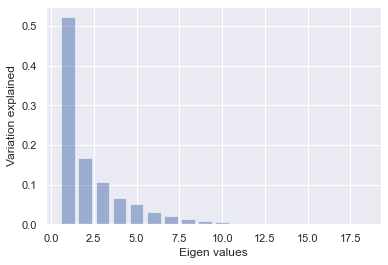

In [153]:
#Plot Eigen values
plt.bar(list(range(1,19)), pca_18.explained_variance_ratio_, alpha = 0.5, align = 'center')
plt.ylabel('Variation explained')
plt.xlabel('Eigen values')
plt.show()

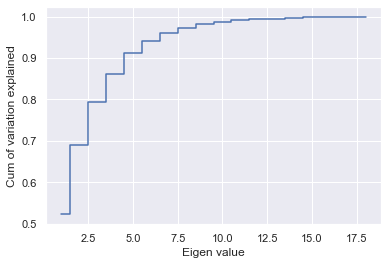

In [154]:
#Plot using step function

plt.step(list(range(1,19)), np.cumsum(pca_18.explained_variance_ratio_), where = 'mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('Eigen value')
plt.show()

We have 8 components in this model that explain 95% variation in this data.

In [155]:
#Applying PCA for 8 components this time
pca_8 = PCA(n_components = 8)
pca_8.fit(data_attr_s)
print(pca_8.components_)
print(pca_8.explained_variance_ratio_)

[[ 2.75259459e-01  2.93392341e-01  3.04556452e-01  2.67593206e-01
   8.04938998e-02  9.72198560e-02  3.16872006e-01 -3.14042361e-01
   3.13953009e-01  2.82790417e-01  3.09310530e-01  3.14149034e-01
   2.72002525e-01 -2.09179819e-02  4.13316728e-02  5.83331566e-02
   3.01560495e-02  7.40813666e-02]
 [-1.27010856e-01  1.26217125e-01 -7.26862818e-02 -1.89635192e-01
  -1.22158741e-01  1.07277825e-02  4.80473095e-02  1.27991503e-02
   6.00351423e-02  1.16182501e-01  6.17536908e-02  5.32757796e-02
   2.09279660e-01  4.88541866e-01 -5.49212020e-02 -1.24152855e-01
  -5.40947666e-01 -5.40279812e-01]
 [-1.19874162e-01 -2.51835016e-02 -5.60058748e-02  2.75066087e-01
   6.42046458e-01  5.91799912e-01 -9.76530949e-02  5.74645766e-02
  -1.09509169e-01 -1.69994013e-02  5.64656174e-02 -1.08711428e-01
  -3.13685232e-02  2.86211092e-01 -1.15693651e-01 -7.54878378e-02
   8.68929277e-03  3.95143108e-02]
 [ 7.83109159e-02  1.87525528e-01 -7.07959698e-02 -4.22567515e-02
   3.28577853e-02  3.13199694e-02 -9.

In [156]:
#Transform the raw data with 18 dim into 8 dims
data_attr_s_pca_8 = pca_8.transform(data_attr_s)
data_attr_s_pca_8.shape

(846, 8)

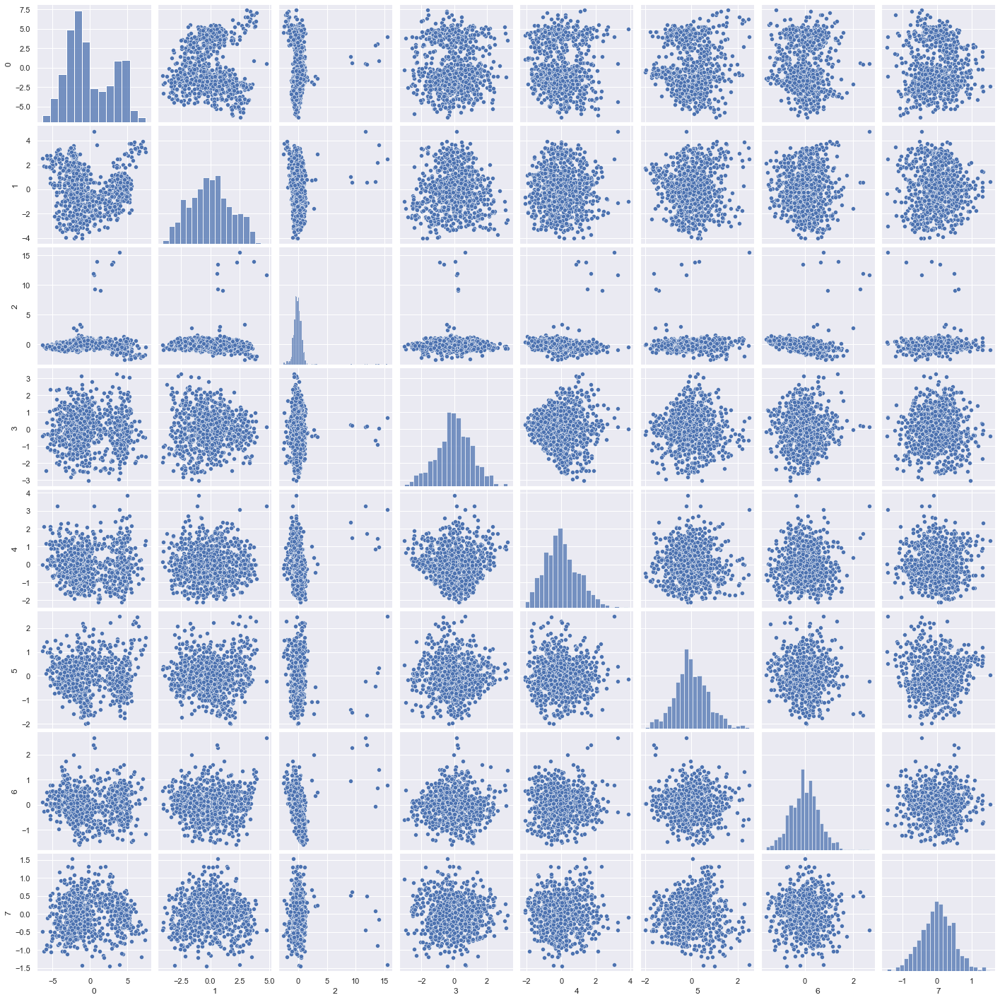

In [157]:
#Draw pairplot to find correlation
sns.pairplot(pd.DataFrame(data_attr_s_pca_8))

# 5. Support Vector Machines

In [158]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report
from sklearn.svm import SVC

In [159]:
accuracies = {}
model = SVC()

X_train, X_test, y_train, y_test = train_test_split(data_attr_s_pca_8, data_target, test_size = 0.30, random_state = 1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
acc_svm = model.score(X_test, y_test) *100

accuracies['SVM'] = acc_svm
print(model.score(X_train, y_train))
print(model.score(X_test, y_test))

0.9611486486486487
0.9409448818897638


In [160]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97       133
           1       0.89      0.97      0.93        59
           2       0.90      0.90      0.90        62

    accuracy                           0.94       254
   macro avg       0.93      0.94      0.93       254
weighted avg       0.94      0.94      0.94       254



**SVM model gives an accuracy of 93%**

# Using Grid Search

In [161]:
#Finding best parameters for our SVM model

param = {
    'C' : [0.01,0.05,0.5,1],
    'kernel' :['linear','rbf']
}

grid_svm = GridSearchCV(model, param_grid = param, scoring = 'accuracy', cv = 10)

In [162]:
grid_svm.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [0.01, 0.05, 0.5, 1],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [163]:
grid_svm.best_params_

{'C': 1, 'kernel': 'rbf'}

In [164]:
#Running our kernel with best parameters


#Kernel = rbf, C = 1
model_svm = SVC(C = 1, kernel = 'rbf', gamma = 1)
X_train, X_test, y_train, y_test = train_test_split(data_attr_s_pca_8, data_target, test_size = 0.30, random_state = 1)
model_svm.fit(X_train, y_train)
y_pred = model_svm.predict(X_test)

acc_svm_gs = model_svm.score(X_test, y_test) * 100
accuracies['SVM_GS'] = acc_svm_gs
print(model.score(X_test, y_test))
print(classification_report(y_test, y_pred))


0.9409448818897638
              precision    recall  f1-score   support

           0       0.78      0.97      0.86       133
           1       0.95      0.71      0.82        59
           2       0.93      0.66      0.77        62

    accuracy                           0.83       254
   macro avg       0.89      0.78      0.82       254
weighted avg       0.86      0.83      0.83       254



**Accuracy score is 83% using Grid Search, however SVM gives an accuracy of 93%**

In [165]:
#Cross validation score for SVM

svm_eval = cross_val_score(estimator = model, X = X_train, y = y_train, cv = 10)
svm_eval.mean()

0.9442090395480225

**Using Grid Search we can infer the model accuracy is 83%.**

# 6. Naive Bayes Algorithm

In [166]:
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics


nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
expected = y_test
predicted = nb_model.predict(X_test)

acc_nb = nb_model.score(X_test, y_test) * 100
accuracies['NB'] = acc_nb

In [167]:
#Determine Model score

print(metrics.classification_report(expected, predicted))
print('Total accuracy: ', np.round(metrics.accuracy_score(expected, predicted), 2))

              precision    recall  f1-score   support

           0       0.76      0.92      0.83       133
           1       0.71      0.61      0.65        59
           2       0.83      0.56      0.67        62

    accuracy                           0.76       254
   macro avg       0.77      0.70      0.72       254
weighted avg       0.76      0.76      0.75       254

Total accuracy:  0.76


**Naive Bayes model gives an accuracy of 76%**

# 7. Model Comparison

<AxesSubplot:>

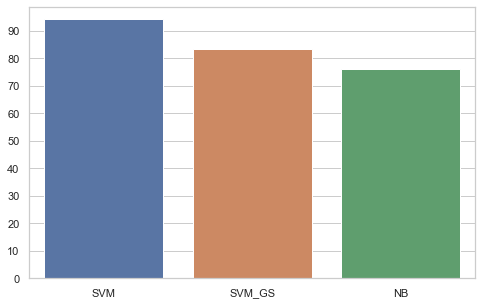

In [168]:
sns.set_style('whitegrid')
plt.figure(figsize = (8,5))
plt.yticks(np.arange(0,100,10))
sns.barplot(x = list(accuracies.keys()), y = list(accuracies.values()))

In [169]:
models = pd.DataFrame({
    'Model': ['SVM', 'SVM_GS','Naive Bayes'],
    
    'Score': [acc_svm, acc_svm_gs, acc_nb]
    })

models.sort_values(by='Score', ascending=False)

,Model,Score
0,SVM,94.094488
1,SVM_GS,83.464567
2,Naive Bayes,75.984252


# 8. Confusion Matrix

In [170]:
y_cm_svm = model.predict(X_test)
y_cm_svm_gs = model_svm.predict(X_test)
y_cm_nb = nb_model.predict(X_test)

In [171]:
from sklearn.metrics import confusion_matrix

cm_svm = confusion_matrix(y_test, y_cm_svm)
cm_svm_gs = confusion_matrix(y_test, y_cm_svm_gs)
cm_nb = confusion_matrix(y_test, y_cm_nb)

<AxesSubplot:title={'center':'NB Confusion Matrix'}>

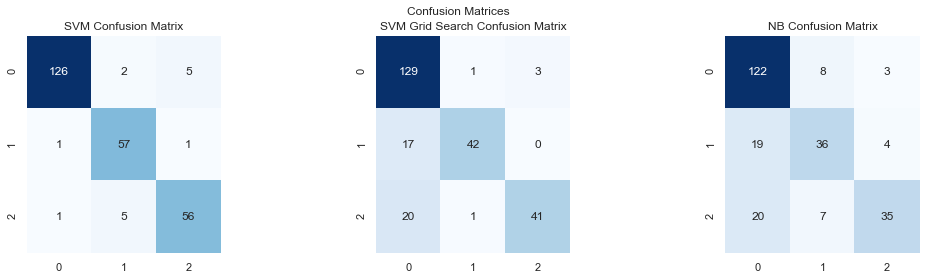

In [172]:
plt.figure(figsize = (16,4))
plt.suptitle("Confusion Matrices",fontsize=12)
plt.subplots_adjust(wspace = 0.8, hspace = 0.8)

plt.subplot(1,3,1)
plt.title("SVM Confusion Matrix")
sns.heatmap(cm_svm, annot = True, cmap = "Blues", fmt = 'd', cbar = False, annot_kws = {"size": 12})


plt.subplot(1,3,2)
plt.title("SVM Grid Search Confusion Matrix")
sns.heatmap(cm_svm_gs, annot = True, cmap = "Blues", fmt = 'd', cbar = False, annot_kws = {"size": 12})

plt.subplot(1,3,3)
plt.title("NB Confusion Matrix")
sns.heatmap(cm_nb, annot = True, cmap = "Blues", fmt = 'd', cbar = False, annot_kws = {"size": 12})

**We can conclude SVM is the best suited algorithm as it gives a good accuracy score of 93% on test data and confusion matrix gives a good classification.**


**To conclude PCA helps to reduced 18 dimension data into 8 dimension data with SVM score of 93% accuracy**

## Project 4

### Domain: 
Sports Management
### Context: 
Company X is a Sports Management Company for International Cricket.
### Data Description: 
The data is collected belongs to batsman from IPL series conducted so far. Attribute Information:
1. Runs: Runs score by the batsman
2. Ave: Average runs scored by the batsman per match
3. SR: strike rate of the batsman
4. Fours: number of boundary/four scored
5. Six: number of boundary/six scored
6. HF: number of half centuries scored so far

### Project Objective:
Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.
Steps and tasks: [ Total Score: 5 points]
1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden
patterns by using all possible methods.
2. Build a data driven model to rank all the players in the dataset using all or the most important performance features.

#### Hint :
- Sports dataset is provided, use the same to implement PCA.
- Obtain eigen values and eigen vectors from the above.
- Perform a mathematical operation between eigen value, eigen vectors and the original dataset to arrive to a single digit score.
    - example: 
                - Say we chose 2 PCs
                - Score for PC1= Eigen vector * Eigen values
                - Similarly calculate score for all chose PCs
                - Add all the score up to get a final score
- Descending sort the players as per their above calculated scores.

In [173]:
#loading the required packages
import numpy as np   
import pandas as pd    
import matplotlib.pyplot as plt 
from scipy.stats import zscore
from sklearn.metrics import silhouette_samples, silhouette_score
import seaborn as sns
%matplotlib inline 
sns.set(color_codes=True)
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [174]:
#importing the data
ipldata=pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')
ipldata=ipldata.dropna(axis=0)
ipldata.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0


## EDA

In [175]:
#checking for the dimension of the data
rows, column = ipldata.shape
print('The dataset contains', rows, 'rows and', column, 'columns.')

The dataset contains 90 rows and 7 columns.


In [176]:
#checking for the data type
print('The data type of each attribute: \n')
ipldata.info()

The data type of each attribute: 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 1 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 5.6+ KB


In [177]:
#5-point summary
ipldata.describe().T

,count,mean,std,min,25%,50%,75%,max
Runs,90.0,219.933333,156.253669,2.00,98.000,196.500,330.7500,733.00
Ave,90.0,24.729889,13.619215,0.50,14.665,24.440,32.1950,81.33
SR,90.0,119.164111,23.656547,18.18,108.745,120.135,131.9975,164.10
Fours,90.0,19.788889,16.399845,0.00,6.250,16.000,28.0000,73.00
Sixes,90.0,7.577778,8.001373,0.00,3.000,6.000,10.0000,59.00
HF,90.0,1.188889,1.688656,0.00,0.000,0.500,2.0000,9.00


In [178]:
print('Duplicated rows: ', ipldata[ipldata.duplicated()].shape[0])

Duplicated rows:  0


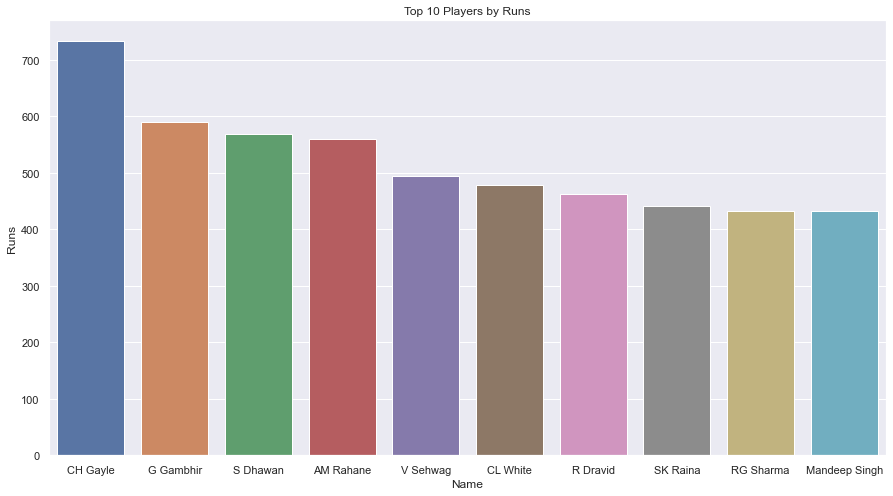

In [179]:
plt.figure(figsize=(15,8))
b1ipldata=ipldata.groupby('Name')['Runs'].sum().sort_values(ascending = False ).head(10)
b1ipldata= b1ipldata.reset_index() 
b1ipldata.columns = ['Name' ,'Runs']
sns.barplot(data= b1ipldata , x= 'Name' , y ='Runs');
plt.title("Top 10 Players by Runs");

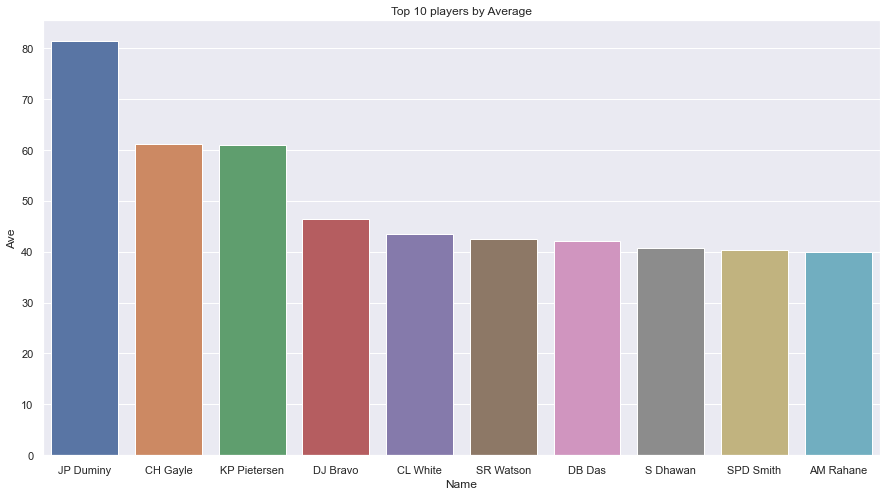

In [180]:
plt.figure(figsize=(15,8))
b1ipldata=ipldata.groupby('Name')['Ave'].sum().sort_values(ascending = False ).head(10)
b1ipldata= b1ipldata.reset_index() 
b1ipldata.columns = ['Name' ,'Ave']
sns.barplot(data= b1ipldata , x= 'Name' , y ='Ave')
plt.title("Top 10 players by Average");

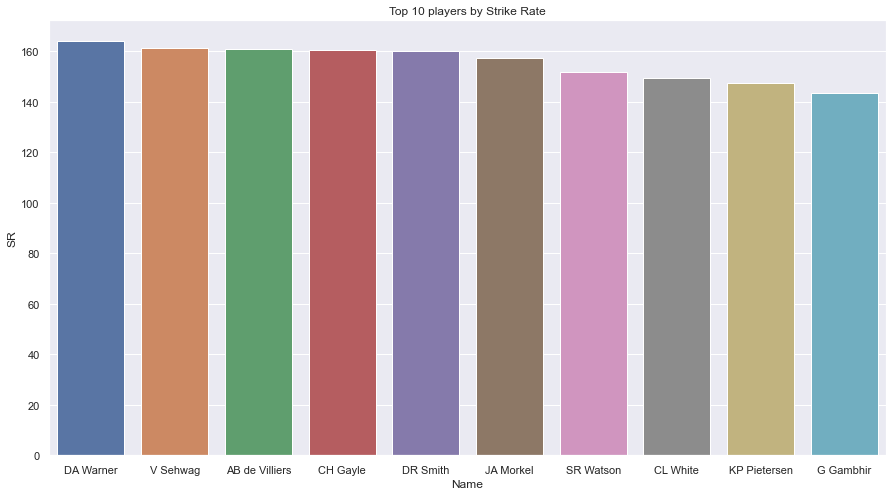

In [181]:
plt.figure(figsize=(15,8))
b1ipldata=ipldata.groupby('Name')['SR'].sum().sort_values(ascending = False ).head(10)
b1ipldata= b1ipldata.reset_index() 
b1ipldata.columns = ['Name' ,'SR']
sns.barplot(data= b1ipldata , x= 'Name' , y ='SR')
plt.title("Top 10 players by Strike Rate");

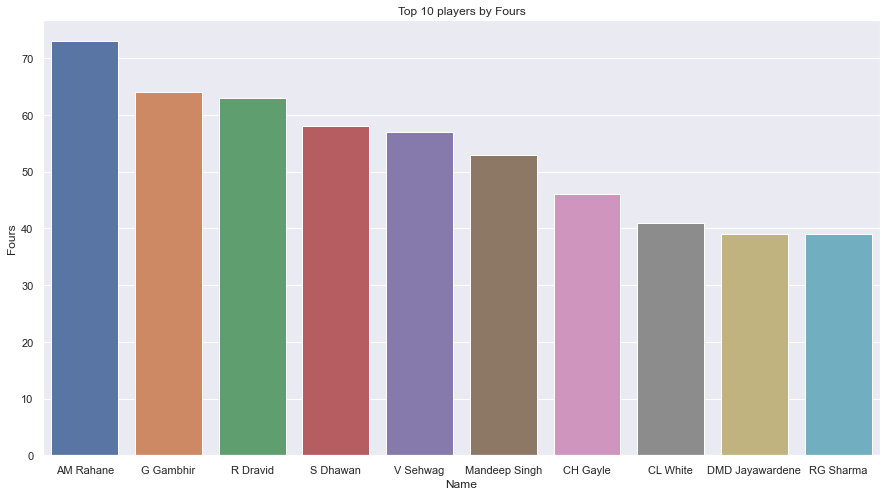

In [182]:
plt.figure(figsize=(15,8))
b1ipldata=ipldata.groupby('Name')['Fours'].sum().sort_values(ascending = False ).head(10)
b1ipldata= b1ipldata.reset_index() 
b1ipldata.columns = ['Name' ,'Fours']
sns.barplot(data= b1ipldata , x= 'Name' , y ='Fours')
plt.title("Top 10 players by Fours");

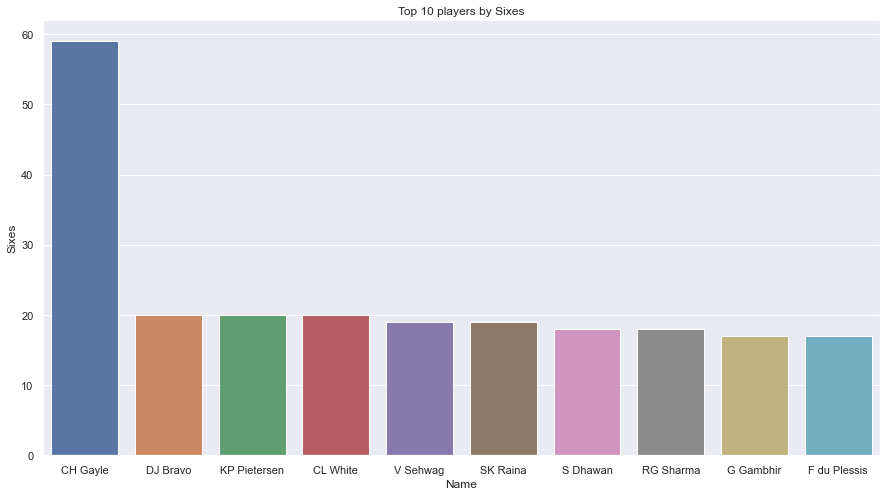

In [183]:
plt.figure(figsize=(15,8))
b1ipldata=ipldata.groupby('Name')['Sixes'].sum().sort_values(ascending = False ).head(10)
b1ipldata= b1ipldata.reset_index() 
b1ipldata.columns = ['Name' ,'Sixes']
sns.barplot(data= b1ipldata , x= 'Name' , y ='Sixes')
plt.title("Top 10 players by Sixes");

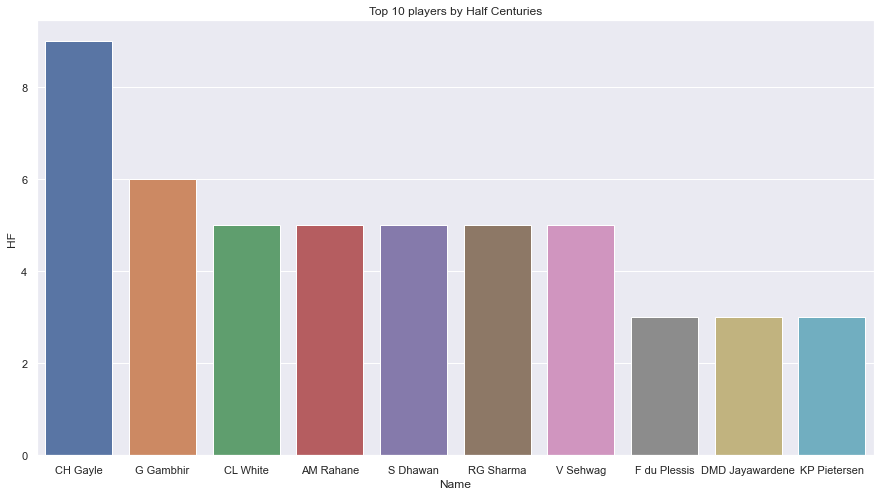

In [184]:
plt.figure(figsize=(15,8))
b1ipldata=ipldata.groupby('Name')['HF'].sum().sort_values(ascending = False ).head(10)
b1ipldata= b1ipldata.reset_index() 
b1ipldata.columns = ['Name' ,'HF']
sns.barplot(data= b1ipldata , x= 'Name' , y ='HF')
plt.title("Top 10 players by Half Centuries");

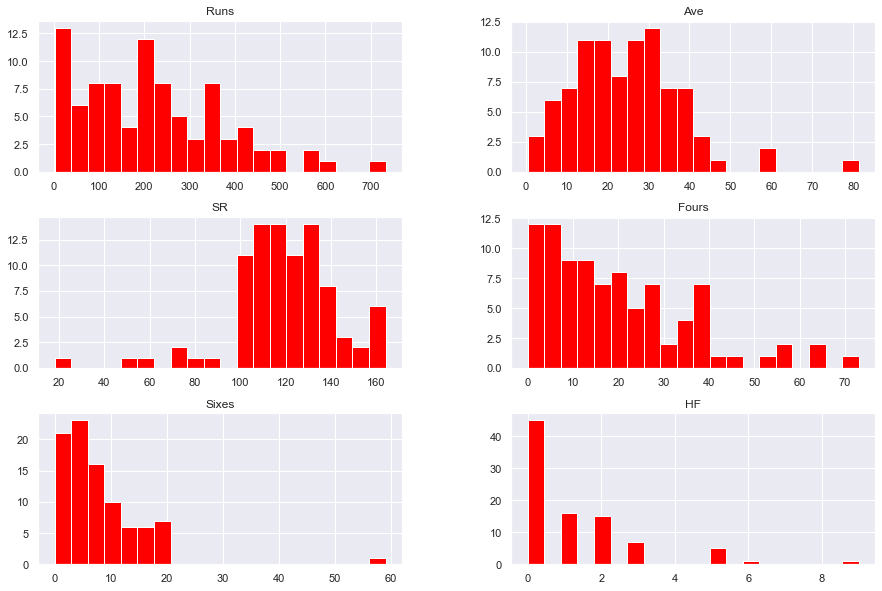

In [185]:
ipldata.hist(bins = 20, figsize = (15, 10), color = 'red')
plt.show()

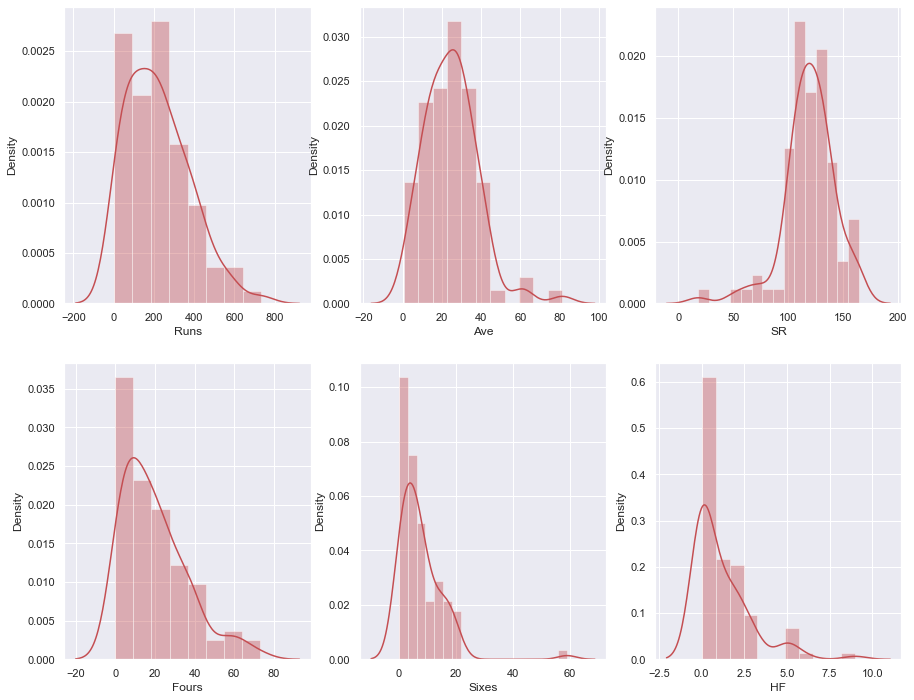

In [186]:
plt.figure(figsize=(15, 12))
col = 1
for i in ipldata.drop(columns='Name').columns:
    plt.subplot(2, 3, col)
    sns.distplot(ipldata[i], color = 'r')
    col += 1 

Strike rate, fours, sixes and half centuries have a skewed distribution

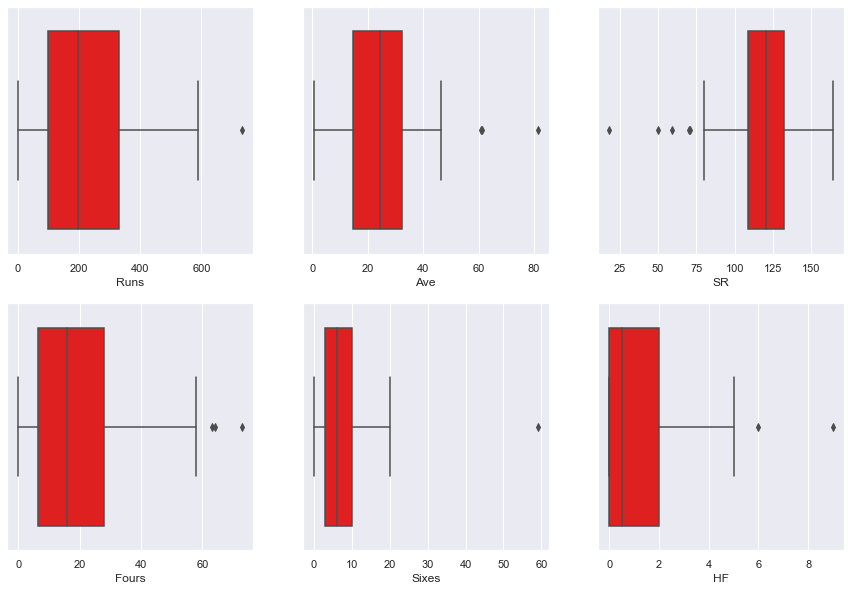

In [187]:
plt.figure(figsize=(15, 10))
col = 1
for i in ipldata.drop(columns='Name').columns:
    plt.subplot(2, 3, col)
    sns.boxplot(ipldata[i],color='red')
    col += 1

There appears to be outliers, will not be treating them as its highly likely that these are genuine observation

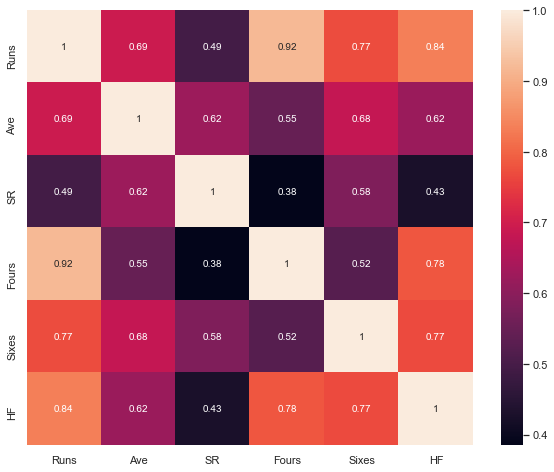

In [188]:
#checking for correlation
plt.figure(figsize=(10,8))
corr=ipldata.drop(columns='Name').corr()
sns.heatmap(corr,annot=True);

All the variable except fours with strike rate, strike rate with half centuries,strike rate with runs, have high correlation

## PCA

In [189]:
X = ipldata.drop('Name',axis =1)  
y = ipldata['Name']

In [190]:
X.shape

(90, 6)

In [191]:
y.shape

(90,)

In [192]:
X.head()

,Runs,Ave,SR,Fours,Sixes,HF
1,733.0,61.08,160.74,46.0,59.0,9.0
3,590.0,36.87,143.55,64.0,17.0,6.0
5,495.0,33.00,161.23,57.0,19.0,5.0
7,479.0,43.54,149.68,41.0,20.0,5.0
9,569.0,40.64,129.61,58.0,18.0,5.0


In [193]:
y.head()

1     CH Gayle
3    G Gambhir
5     V Sehwag
7     CL White
9     S Dhawan
Name: Name, dtype: object

In [194]:
X.columns

Index(['Runs', 'Ave', 'SR', 'Fours', 'Sixes', 'HF'], dtype='object')

In [195]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled[:6,:6]

array([[3.30194495, 2.68398404, 1.76732512, 1.60720741, 6.46267873,
        4.6515508 ],
       [2.38163935, 0.89638968, 1.03660547, 2.71092764, 1.18417277,
        2.86503769],
       [1.77024751, 0.6106404 , 1.78815424, 2.28170311, 1.43553019,
        2.26953332],
       [1.66727626, 1.38888263, 1.29718205, 1.30061846, 1.56120891,
        2.26953332],
       [2.24648957, 1.17475526, 0.44403817, 2.3430209 , 1.30985148,
        2.26953332],
       [2.18856824, 1.12749957, 0.43213582, 3.26278775, 0.30442177,
        2.26953332]])

In [196]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)

#### Computing Eigenvectors and Eigenvalues:¶

Before computing Eigen vectors and values we need to calculate covariance matrix.

#### Covariance Matrix


In [197]:
import numpy as np
mean_vec = np.mean(X_scaled, axis=0)
cov_mat = (X_scaled - mean_vec).T.dot((X_scaled - mean_vec)) / (X_scaled.shape[0]-1)
print('Covariance Matrix \n%s' %cov_mat)

Covariance Matrix 
[[1.01123596 0.70077082 0.49903347 0.9291323  0.77842677 0.84453142]
 [0.70077082 1.01123596 0.63061271 0.55234856 0.69008186 0.62772842]
 [0.49903347 0.63061271 1.01123596 0.38913406 0.59050396 0.43238784]
 [0.9291323  0.55234856 0.38913406 1.01123596 0.52844526 0.79249429]
 [0.77842677 0.69008186 0.59050396 0.52844526 1.01123596 0.77632221]
 [0.84453142 0.62772842 0.43238784 0.79249429 0.77632221 1.01123596]]


In [198]:
print('NumPy Covariance Matrix: \n%s' %np.cov(X_scaled.T))

NumPy Covariance Matrix: 
[[1.01123596 0.70077082 0.49903347 0.9291323  0.77842677 0.84453142]
 [0.70077082 1.01123596 0.63061271 0.55234856 0.69008186 0.62772842]
 [0.49903347 0.63061271 1.01123596 0.38913406 0.59050396 0.43238784]
 [0.9291323  0.55234856 0.38913406 1.01123596 0.52844526 0.79249429]
 [0.77842677 0.69008186 0.59050396 0.52844526 1.01123596 0.77632221]
 [0.84453142 0.62772842 0.43238784 0.79249429 0.77632221 1.01123596]]


 Equivalently we could have used Numpy np.cov to calculate covariance matrix

Text(0.5, 1.0, 'Correlation Between Different Features')

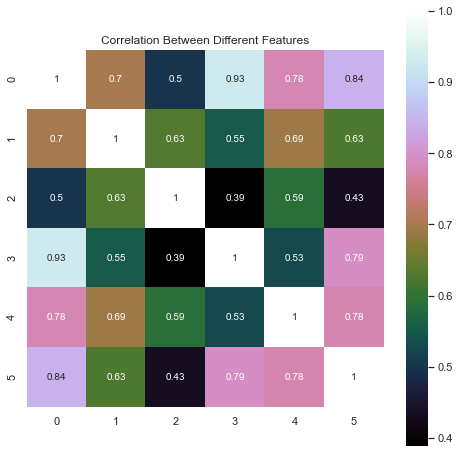

In [199]:
plt.figure(figsize=(8,8))
sns.heatmap(cov_mat, vmax=1, square=True,annot=True,cmap='cubehelix')

plt.title('Correlation Between Different Features')

#### Eigen Decomposition of the Covariance Matrix

In [200]:
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigen Vectors \n%s' %eig_vecs)
print('\nEigen Values \n%s' %eig_vals)

Eigen Vectors 
[[-0.4582608  -0.26643209 -0.70483594 -0.45840889  0.10977942  0.00520142]
 [-0.39797313  0.33111756  0.0606373   0.10122837 -0.00550486 -0.84736307]
 [-0.3253838   0.69780334 -0.05624934  0.11890348  0.45013448  0.43275029]
 [-0.40574167 -0.47355804  0.58514214 -0.09676885  0.50823538  0.03252305]
 [-0.41733459  0.17902455  0.35786211 -0.39458014 -0.66942589  0.24878157]
 [-0.43237178 -0.27593225 -0.16096217  0.77486668 -0.28082541  0.17811777]]

Eigen Values 
[4.30252561 0.83636692 0.01706297 0.16567829 0.41665751 0.32912443]


#### Selecting Principal Components

In order to decide which eigenvector(s) can dropped without losing too much information for the construction of lower-dimensional subspace, we need to inspect the corresponding eigenvalues: The eigenvectors with the lowest eigenvalues bear the least information about the distribution of the data; those are the ones can be dropped.

In [201]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigen Values in Descending Order:')
for i in eig_pairs:
    print(i[0])

Eigen Values in Descending Order:
4.302525607296722
0.8363669184835505
0.41665750877671587
0.3291244319930167
0.16567829190781508
0.01706297187926516


Explained Variance After sorting the eigenpairs, the next question is "how many principal components are we going to choose for our new feature subspace?" A useful measure is the so-called "explained variance," which can be calculated from the eigenvalues. The explained variance tells us how much information (variance) can be attributed to each of the principal components.

In [202]:
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
var_exp

[70.91199612026071,
 13.784565878710353,
 6.867133015023643,
 5.424458230996009,
 2.730623699962134,
 0.2812230550471477]

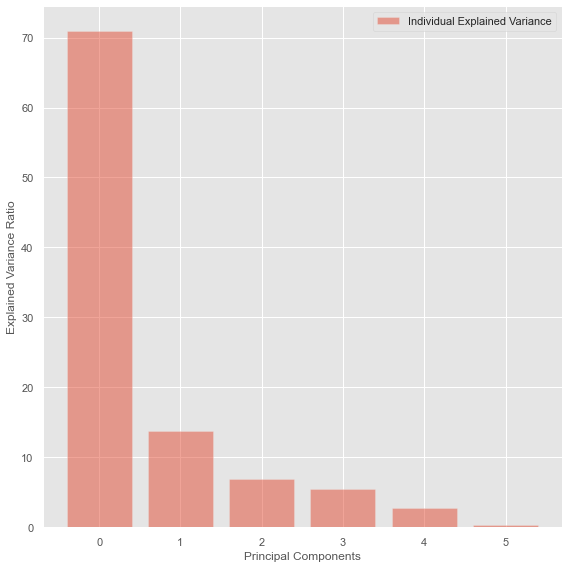

In [203]:
with plt.style.context('ggplot'):
    plt.figure(figsize=(8, 8))

    plt.bar(range(6), var_exp, alpha=0.5, align='center',
            label='Individual Explained Variance')
    plt.ylabel('Explained Variance Ratio')
    plt.xlabel('Principal Components')
    plt.legend(loc='best')
    plt.tight_layout()

The plot above clearly shows that maximum variance (somewhere around 71%) can be explained by the first principal component alone. The second,third,fourth and fifth principal component share almost equal amount of information.Comparatively 6th components share less amount of information as compared to the rest of the Principal components.But those information cannot be ignored since they both contribute almost 8% of the data.But we can drop the last component as it has less than 5% of the variance

#### Projection Matrix

In [204]:
matrix_w = np.hstack((eig_pairs[0][1].reshape(6,1), 
                      eig_pairs[1][1].reshape(6,1)
                    ))
print('Matrix W:\n', matrix_w)

Matrix W:
 [[-0.4582608  -0.26643209]
 [-0.39797313  0.33111756]
 [-0.3253838   0.69780334]
 [-0.40574167 -0.47355804]
 [-0.41733459  0.17902455]
 [-0.43237178 -0.27593225]]


Projection Onto the New Feature Space In this last step we will use the 6×2-dimensional projection matrix W to transform our samples onto the new subspace via the equation Y=X×W

#### Dot Product

In [205]:
Y = X_scaled.dot(matrix_w)
print(Y)

[[-8.51677407e+00  3.54574790e-01]
 [-4.61833957e+00 -1.47672990e+00]
 [-4.14225050e+00 -4.71438127e-01]
 [-3.89941107e+00 -4.18155493e-02]
 [-4.12007165e+00 -1.40100174e+00]
 [-4.02443639e+00 -2.02508191e+00]
 [-2.87928084e+00  1.49435388e+00]
 [-2.91901518e+00 -9.43018299e-01]
 [-2.32738860e+00  1.13355142e+00]
 [-2.08164241e+00  1.75793775e+00]
 [-2.08328069e+00  1.16901158e+00]
 [-1.77694308e+00  1.17265902e+00]
 [-2.12516667e+00 -1.03583873e-01]
 [-1.93887249e+00  2.87326352e-01]
 [-1.72763623e+00  1.37253008e+00]
 [-1.81713174e+00  5.69579415e-02]
 [-1.86989515e+00 -4.19705512e-02]
 [-1.44931719e+00  4.67061997e-01]
 [-1.79578490e+00 -1.20680898e+00]
 [-1.83452229e+00 -1.99101867e+00]
 [-6.85215121e-01  1.75011952e+00]
 [-1.28111282e+00 -6.10477637e-01]
 [-1.23672458e+00  8.39625442e-01]
 [-1.03374737e+00 -8.80392827e-01]
 [-1.38634619e+00 -9.01870077e-01]
 [-1.18109656e+00 -7.36296386e-01]
 [-6.83733764e-01  7.12470514e-01]
 [-1.04356191e+00 -1.27833752e+00]
 [-1.02916835e+00 -8

### PCA

Text(0, 0.5, 'Cumulative Explained Variance')

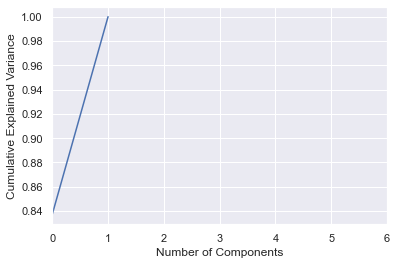

In [206]:
from sklearn.decomposition import PCA
# pca = PCA().fit(X_scaled)
pca = PCA().fit(Y)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,6,1)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

#### PCA with 2 Components

In [207]:
from sklearn.decomposition import PCA 
pca = PCA(n_components=2)
# pca_result1 = pca.fit(X_scaled)
PC1 = pca.fit(Y)

In [208]:
PC1

PCA(n_components=2)

In [209]:
PC2 = PC1.transform(Y)
PC2


array([[ 8.51677407e+00, -3.54574790e-01],
       [ 4.61833957e+00,  1.47672990e+00],
       [ 4.14225050e+00,  4.71438127e-01],
       [ 3.89941107e+00,  4.18155493e-02],
       [ 4.12007165e+00,  1.40100174e+00],
       [ 4.02443639e+00,  2.02508191e+00],
       [ 2.87928084e+00, -1.49435388e+00],
       [ 2.91901518e+00,  9.43018299e-01],
       [ 2.32738860e+00, -1.13355142e+00],
       [ 2.08164241e+00, -1.75793775e+00],
       [ 2.08328069e+00, -1.16901158e+00],
       [ 1.77694308e+00, -1.17265902e+00],
       [ 2.12516667e+00,  1.03583873e-01],
       [ 1.93887249e+00, -2.87326352e-01],
       [ 1.72763623e+00, -1.37253008e+00],
       [ 1.81713174e+00, -5.69579415e-02],
       [ 1.86989515e+00,  4.19705512e-02],
       [ 1.44931719e+00, -4.67061997e-01],
       [ 1.79578490e+00,  1.20680898e+00],
       [ 1.83452229e+00,  1.99101867e+00],
       [ 6.85215121e-01, -1.75011952e+00],
       [ 1.28111282e+00,  6.10477637e-01],
       [ 1.23672458e+00, -8.39625442e-01],
       [ 1.

In [210]:
pca.explained_variance_ratio_

array([0.83724763, 0.16275237])

In [211]:
scores_pca=pca.transform(Y)
scores_pca

array([[ 8.51677407e+00, -3.54574790e-01],
       [ 4.61833957e+00,  1.47672990e+00],
       [ 4.14225050e+00,  4.71438127e-01],
       [ 3.89941107e+00,  4.18155493e-02],
       [ 4.12007165e+00,  1.40100174e+00],
       [ 4.02443639e+00,  2.02508191e+00],
       [ 2.87928084e+00, -1.49435388e+00],
       [ 2.91901518e+00,  9.43018299e-01],
       [ 2.32738860e+00, -1.13355142e+00],
       [ 2.08164241e+00, -1.75793775e+00],
       [ 2.08328069e+00, -1.16901158e+00],
       [ 1.77694308e+00, -1.17265902e+00],
       [ 2.12516667e+00,  1.03583873e-01],
       [ 1.93887249e+00, -2.87326352e-01],
       [ 1.72763623e+00, -1.37253008e+00],
       [ 1.81713174e+00, -5.69579415e-02],
       [ 1.86989515e+00,  4.19705512e-02],
       [ 1.44931719e+00, -4.67061997e-01],
       [ 1.79578490e+00,  1.20680898e+00],
       [ 1.83452229e+00,  1.99101867e+00],
       [ 6.85215121e-01, -1.75011952e+00],
       [ 1.28111282e+00,  6.10477637e-01],
       [ 1.23672458e+00, -8.39625442e-01],
       [ 1.

### Analyze the Results of PCA 

In [212]:

df_pca = pd.concat([ipldata.reset_index(drop = True), pd.DataFrame(scores_pca)],axis = 1)

df_pca.columns.values[-2:] = ['PC1','PC2',]


In [213]:
df_pca

,Name,Runs,Ave,SR,Fours,Sixes,HF,PC1,PC2
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,8.516774,-0.354575
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,4.618340,1.476730
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,4.142251,0.471438
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0,3.899411,0.041816
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,4.120072,1.401002
...,...,...,...,...,...,...,...,...,...
85,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0,-3.006639,0.972067
86,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0,-3.000751,1.049898
87,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0,-3.070959,1.463324
88,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0,-3.422022,1.616542


#### Calculate score for all chose PCs and derieve the ranking mechanism for top performing player performing mathematical operation and derieve the ranking score in single digits

In [214]:
df_pca['Final Score'] = round(df_pca['PC1'] + df_pca['PC2'],3)
df_pca

,Name,Runs,Ave,SR,Fours,Sixes,HF,PC1,PC2,Final Score
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,8.516774,-0.354575,8.162
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,4.618340,1.476730,6.095
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,4.142251,0.471438,4.614
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0,3.899411,0.041816,3.941
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,4.120072,1.401002,5.521
...,...,...,...,...,...,...,...,...,...,...
85,Z Khan,12.0,6.00,70.58,1.0,0.0,0.0,-3.006639,0.972067,-2.035
86,WD Parnell,19.0,4.75,70.37,2.0,0.0,0.0,-3.000751,1.049898,-1.951
87,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0,-3.070959,1.463324,-1.608
88,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0,-3.422022,1.616542,-1.805


#### Display the Ranking of Top Performing Players in Decending Order(Top to Bottom) 

In [215]:
df_pca = df_pca.sort_values(['Final Score'],
                          ascending=[False])
df_pca.head(20)

,Name,Runs,Ave,SR,Fours,Sixes,HF,PC1,PC2,Final Score
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,8.516774,-0.354575,8.162
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,4.618340,1.476730,6.095
5,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,4.024436,2.025082,6.050
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,4.120072,1.401002,5.521
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,4.142251,0.471438,4.614
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0,3.899411,0.041816,3.941
7,RG Sharma,433.0,30.92,126.60,39.0,18.0,5.0,2.919015,0.943018,3.862
19,R Dravid,462.0,28.87,112.13,63.0,4.0,2.0,1.834522,1.991019,3.826
18,Mandeep Singh,432.0,27.00,126.31,53.0,7.0,2.0,1.795785,1.206809,3.003
27,DMD Jayawardene,335.0,27.91,112.41,39.0,3.0,3.0,1.043562,1.278338,2.322


In [216]:
df_pca.tail(30)

,Name,Runs,Ave,SR,Fours,Sixes,HF,PC1,PC2,Final Score
70,MN Samuels,124.0,17.71,100.81,7.0,5.0,0.0,-1.502572,0.042846,-1.460
71,MJ Clarke,98.0,16.33,104.25,12.0,0.0,0.0,-1.710077,0.187650,-1.522
50,DT Christian,145.0,29.00,122.88,8.0,6.0,0.0,-0.726288,-0.845286,-1.572
87,PC Valthaty,30.0,5.00,58.82,4.0,0.0,0.0,-3.070959,1.463324,-1.608
49,M Manhas,120.0,30.00,125.00,10.0,4.0,0.0,-0.796453,-0.872412,-1.669
38,DB Das,126.0,42.00,135.48,9.0,6.0,0.0,-0.201160,-1.540408,-1.742
62,Harbhajan Singh,108.0,12.00,135.00,14.0,3.0,0.0,-1.175394,-0.610886,-1.786
67,PP Chawla,106.0,13.25,120.45,9.0,4.0,0.0,-1.417756,-0.380974,-1.799
88,RP Singh,6.0,3.00,50.00,0.0,0.0,0.0,-3.422022,1.616542,-1.805
66,AD Mathews,127.0,18.14,117.59,5.0,4.0,0.0,-1.351204,-0.495835,-1.847


1. The X-axis here is our ‘PC 2’. The y-axis, on the other hand, is the first ‘PC 1’.

3. Thus Principal Component Analysis is used to remove the redundant features from the datasets without losing much information.These features are low dimensional in nature.The first component has the highest variance followed by second. PCA works best on data set having 2 or higher dimensions. Because, with higher dimensions, it becomes increasingly difficult to make interpretations from the resultant cloud of data.

4. Finally, it is important to note that our data set contained only a few features from the get-go. So, when we further reduced the dimensionality, using ‘P C A’ we found out we only need two components to separate the data. That’s the reason why even a two-dimensional plot is enough to see the separation. This might not always be the case. We may have more features and more components respectively in real life problems or other data sets. Then you might need a different way to represent the results of PCA.

### Conclusion
1. Goal  to build a data driven batsman ranking model for the sports management company to make business decisions  Business owners can now take decision on the grading system created for the best playing batsman

2. Sports dataset  provided, used the same to implement PCA. Obtained eigen values and eigen vectors from the above & performed a mathematical operation between eigen value, eigen vectors and the original dataset to arrive at a single digit score. We saw and noticed we didnt lose much after dimensional reduction. 

3. We see there is no significant difference in predictions of PCA  for best performing player / batsman 

4. Business can take decision basis the PCA to choose the top performing batsman / player for their respective teams

## Project 5

Questions: [ Total Score: 5 points]
1. List down all possible dimensionality reduction techniques that can be implemented using python.
2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python.

There are many dimensional reduction techniques available. Please list them.For dmiensional reduction on multimedia data. PFB approach for dimensional reduction for images: Import images into python using PIL or any other python image library

1. Display the image - actual
2. Display the image - matrix (hint: Image is a MXN matrix of number )
3. SL algorithms require a MxN dataframe to classify. Whereas here a single image is MxN, hence making it difficult for SL algorithm to intake data.
4. Hint solution: Flatten each image i.e. MxN ---> 1X(M*N)
5. Apply SL algorithm like KNN or SVM or any other algorithm of your choice. Note the accuracy (A1)
6. Use the image matrix to perform pPCA on it.
7. Apply the same SL algorithm as used above on the dimensionally reduced data . Note the accuracy (A2)
8. Compare A1 ~ A2. If they are similar then dimesional reduction has worked on image.

Reference link: https://www.kaggle.com/hamishdickson/preprocessing-images-with-dimensionality-reduction

### Solution Part I 
### List of all Possible Dimensionality Techniques and When to Use Them
### Dimensionality Reduction Techniques can be Classified into 2 to 3 types
### Feature Selection: <br/>
a) Missing Value Ratio: If the dataset has too many missing values, we use this approach to reduce the number of variables. We can drop the variables having a large number of missing values in them. <br/>
b) Low Variance filter: We apply this approach to identify and drop constant variables from the dataset. The target variable is not unduly affected by variables with low variance, and hence these variables can be safely dropped. <br/>
c) High Correlation filter: A pair of variables having high correlation increases multicollinearity in the dataset. So, we can use this technique to find highly correlated features and drop them accordingly. <br/>
d) Random Forest: This is one of the most commonly used techniques which tells us the importance of each feature present in the dataset. We can find the importance of each feature and keep the top most features, resulting in dimensionality reduction. <br/>
e) Both Backward Feature Elimination and Forward Feature Selection techniques take a lot of computational time and are thus  generally used on smaller datasets. <br/>
### Components / Factor Based: <br/>
a) Factor Analysis: This technique is best suited for situations where we have highly correlated set of variables. It divides the variables based on their correlation into different groups, and represents each group with a factor. <br/>
b) Principal Component Analysis: This is one of the most widely used techniques for dealing with linear data. It divides the data into a set of components which try to explain as much variance as possible. <br/>
c) Independent Component Analysis: We can use ICA to transform the data into independent components which describe the data using less number of components. <br/>
### Projection Based: <br/>
a) ISOMAP: We use this technique when the data is strongly non-linear. <br/>
b) UMAP: This technique works well for high dimensional data. Its run-time is shorter

#### Solution Part II 

#### Introduction

There already exists a plethora of notebooks discussing the merits of dimensionality reduction methods, in particular the Big 3 of PCA (Principal Component Analysis), LDA ( Linear Discriminant Analysis). Quite a handful of these have compared one to the other but few have gathered all 3 in one go. Therefore this notebook will aim to provide an introductory exposition on these 3 methods as well as to portray their visualisations interactively and hopefully more intuitively via the Plotly visualisation library. The methods are structured and implemented as follows below :

#### Principal Component Analysis ( PCA ) - Unsupervised, Linear Method

#### Linear Discriminant Analysis (LDA) - Supervised, Linear Method


#### Curse of Dimensionality & Dimensionality Reduction

The term "Curse of Dimensionality" has been oft been thrown about, especially when PCA, LDA is thrown into the mix. This phrase refers to how our perfectly good and reliable Machine Learning methods may suddenly perform badly when we are dealing in a very high-dimensional space. But what exactly do all these 3 acronyms do? They are essentially transformation methods used for dimensionality reduction. Therefore, if we are able to project our data from a higher-dimensional space to a lower one while keeping most of the relevant information, that would make life a lot easier for our learning methods.

#### MNIST Dataset

For the purposes of this interactive guide, the MNIST (Mixed National Institute of Standards and Technology) computer vision digit dataset was chosen partly due to its simplicity and also surprisingly deep and informative research that can be done with the dataset. 

So let's load the training data and see what we have

### Loading the libraries and MNIST Dataset ( Train & Test Data )

In [217]:
# This Python 3 environment comes with many helpful analytics libraries installed
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra

import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the local drive
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC 

from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import train_test_split # to create train and test data set 
from sklearn import metrics # to check accuracy score
import plotly.offline as py
py.init_notebook_mode(connected=True)

import plotly.graph_objs as go
import plotly.tools as tls
import seaborn as sns
import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline


from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')
# Any results you write to the current directory are saved as output.

In [218]:
train=pd.read_csv('mnist_train.csv')
train.shape

(60000, 785)

The MNIST set consists of 42,000 rows and 785 columns. There are 28 x 28 pixel images of digits ( contributing to 784 columns) as well as one extra label column which is essentially a class label to state whether the row-wise contribution to each digit gives a 1 or a 9. Each row component contains a value between one and zero and this describes the intensity of each pixel.

## Train Data Set Info

In [219]:
train.head()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Lets check if there are any null values

In [220]:
train.isnull().sum().sum()

0

## As it is a classification problem lets check whether we have balanced or imbalanced classes 

In [221]:
train['label'].value_counts()

1    6742
7    6265
3    6131
2    5958
9    5949
0    5923
6    5918
8    5851
4    5842
5    5421
Name: label, dtype: int64

<AxesSubplot:xlabel='label', ylabel='count'>

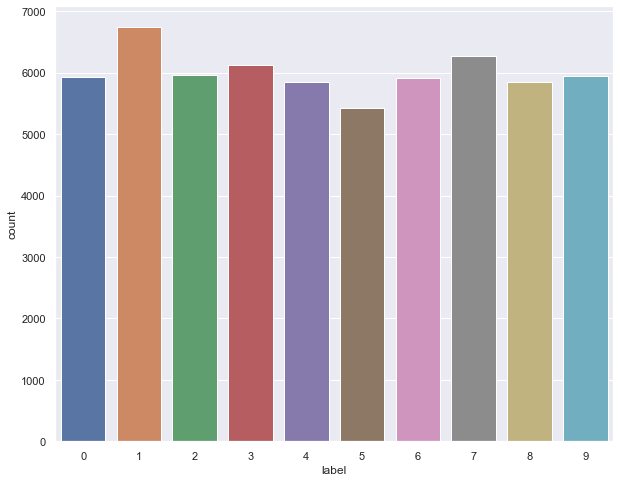

In [222]:
plt.figure(figsize=(10,8))
sns.countplot(train['label'])

In [223]:
X = train.drop('label', axis =1).values
y = train['label'].values

In [224]:
# save the labels to a Pandas series target
target = train['label']
# Drop the label feature
train.drop("label",axis=1,inplace=True)

#### Lets Scale down Our Data
**By Dividing it by Max Value of Pixel i.e. 255**

In [225]:
X = X/255

## Lets View one of the Image from Dataset

## Train and Test Dataset

In [226]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [227]:
X_train.shape, X_test.shape

((45000, 784), (15000, 784))

#### Train Models on SVM Classifer , Random Forest, KNN, XG Boost Model and Check the Accuracy

In [228]:
from sklearn.svm import SVC 

svm = SVC()
svm.fit(X_train, y_train)

pred = svm.predict(X_test)

pre_pca_svm = metrics.accuracy_score(y_test, pred)

In [229]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()

rf.fit(X_train, y_train)

pred_rf = rf.predict(X_test)

pre_pca_rf = metrics.accuracy_score(y_test, pred_rf)

**For KNN let us check for different neighbours ranging from 1 to 20 and will select neighbour with max accuracy**

In [230]:
from sklearn.neighbors import KNeighborsClassifier

acc = []

for i in range(1, 21, 1):
    knn = KNeighborsClassifier(n_neighbors=i, n_jobs=-1)
    knn.fit(X_train, y_train)
    
    pred_knn = knn.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, pred_knn))

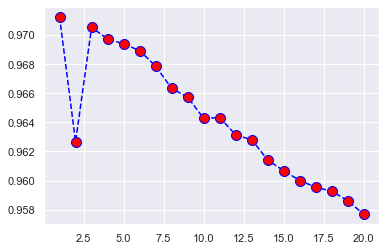

In [231]:
plt.plot(range(1,21,1), acc, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)

**We can see that we have got max accuracy for neighbour 1 and 3**

In [232]:
knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
knn.fit(X_train, y_train)

pred_knn = knn.predict(X_test)
pre_pca_knn = metrics.accuracy_score(y_test, pred_knn)

In [233]:
from xgboost import XGBClassifier

xgb = XGBClassifier(n_jobs=-1)

xgb.fit(X_train, y_train)

pred_xgb = xgb.predict(X_test)
pre_pca_xgb = metrics.accuracy_score(y_test, pred_xgb)

[20:01:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


**Out of 4 algo's both SVM AND XG Boost has Perfomed better as compared to KNN and Random Forest**

Now lets try reducing our features using PCA and see if our accuracy improves or not

## PCA

Principal Component Analysis (PCA)

In a nutshell, PCA is a linear transformation algorithm that seeks to project the original features of our data onto a smaller set of features ( or subspace ) while still retaining most of the information. To do this the algorithm tries to find the most appropriate directions/angles ( which are the principal components ) that maximise the variance in the new subspace. Why maximise the variance though?

To answer the question, more context has to be given about the PCA method. One has to understand that the principal components are orthogonal to each other ( think right angle ). As such when generating the covariance matrix ( measure of how related 2 variables are to each other ) in our new subspace, the off-diagonal values of the covariance matrix will be zero and only the diagonals ( or eigenvalues) will be non-zero. It is these diagonal values that represent the variances of the principal components that we are talking about or information about the variability of our features.

Therefore when PCA seeks to maximise this variance, the method is trying to find directions ( principal components ) that contain the largest spread/subset of data points or information ( variance ) relative to all the data points present.

Calculating the Eigenvectors

Now it may be informative to observe how the variances look like for the digits in the MNIST dataset. Therefore to achieve this, let us calculate the eigenvectors and eigenvalues of the covarience matrix as follows

#### Standardize the Data

In [234]:
from sklearn.preprocessing import StandardScaler
X = train.values
X_std = StandardScaler().fit_transform(X)

# Calculating Eigenvectors and eigenvalues of Cov matirx
mean_vec = np.mean(X_std, axis=0)
cov_mat = np.cov(X_std.T)
eig_vals, eig_vecs = np.linalg.eig(cov_mat)
# Create a list of (eigenvalue, eigenvector) tuples
eig_pairs = [ (np.abs(eig_vals[i]),eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the eigenvalue, eigenvector pair from high to low
eig_pairs.sort(key = lambda x: x[0], reverse= True)

# Calculation of Explained Variance from the eigenvalues
tot = sum(eig_vals)
var_exp = [(i/tot)*100 for i in sorted(eig_vals, reverse=True)] # Individual explained variance
cum_var_exp = np.cumsum(var_exp) # Cumulative explained variance

In [235]:
#PCA Analysis

#Standardizing the Data

from sklearn.preprocessing import StandardScaler
X = train.values
X_std = StandardScaler().fit_transform(X)

mean_vec=np.mean(X_std,axis=0)
cov_mat=np.cov(X_std.T)
eigvalues ,eigvectors =np.linalg.eig(cov_mat)

eigpairs=[(np.abs(eigvalues[i]),eigvectors[:,i] )for i in range(len(eigvalues))]


eigpairs.sort(key=lambda x:x[0],reverse=True)
   
tot=sum(eigvalues)
var_exp=[(i/tot)*100 for i in sorted(eigvalues,reverse=True)]
cum_var_exp=np.cumsum(var_exp)


In [236]:
#Using plotly to Visualise Individual Explained Variance and Cummulative Explained Variance

trace1 = go.Scatter(
    x=list(range(784)),
    y= cum_var_exp,
    mode='lines+markers',
    name="'Cumulative Explained Variance'",
   
    line = dict(
        shape='spline',
        color = 'goldenrod'
    )
)
trace2 = go.Scatter(
    x=list(range(784)),
    y= var_exp,
    mode='lines+markers',
    name="'Individual Explained Variance'",
 
     line = dict(
        shape='linear',
        color = 'black'
    )
)
fig = tls.make_subplots(insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.5}],
                          print_grid=True)

fig.append_trace(trace1,1,1)
fig.append_trace(trace2,1,1)


fig.layout.title='explained Variance plots'
fig.layout.xaxis=dict(range=[0,800],title='Feature columns')
fig.layout.yaxis=dict(range=[0,100],title='explained variance')


py.iplot(fig,filename='inset example')

This is the format of your plot grid:
[ (1,1) x,y ]

With insets:
[ x2,y2 ] over [ (1,1) x,y ]



#### We see that nearly 90% of the explained variance can be explained by 200 features

In [237]:
pca=PCA(30)
pca.fit(X_std)

PCA(n_components=30)

In [238]:
X_pca=pca.transform(X_std)

In [239]:
X_pca.shape

(60000, 30)

In [240]:
X_std.shape

(60000, 784)

In [241]:
eigenvalues=pca.components_
eigenvalues.shape

(30, 784)

## Plotting Eigen Values

As alluded to above, since the PCA method seeks to obtain the optimal directions (or eigenvectors) that captures the most variance ( spreads out the data points the most ). Therefore it may be informative ( and cool) to visualise these directions and their associated eigenvalues. For the purposes of this notebook and for speed, we will invoke PCA to only extract the top 30 eigenvalues ( using Sklearn's .components_ call) from the digit dataset and visually compare.

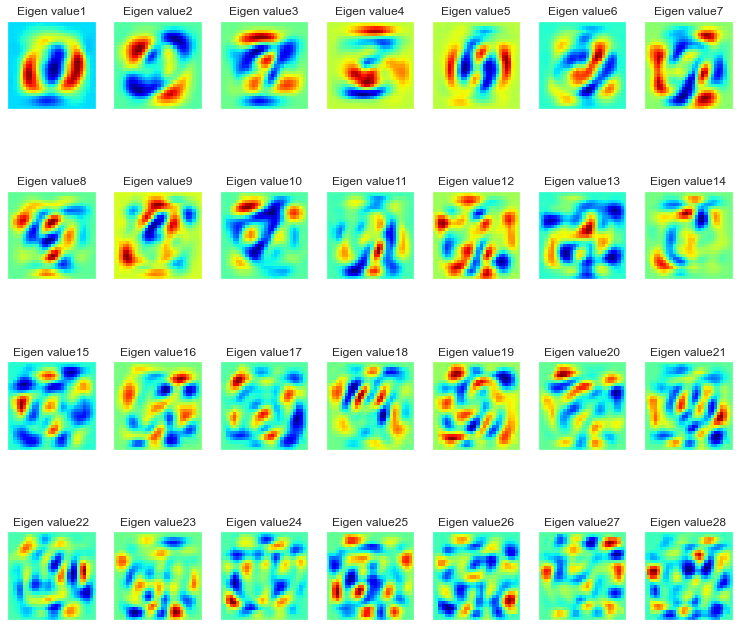

In [242]:

plt.figure(figsize=(13,12))

x_row=4
y_col=7

for i in list(range(x_row*y_col)):
    
    plt.subplot(x_row,y_col,i+1)
    plt.imshow(eigenvalues[i].reshape(28,28),cmap='jet')
    title_='Eigen value'+str(i+1)
    plt.title(title_)
    plt.xticks(())
    plt.yticks(())
plt.show()

#### Takeaway from the Plots

The subplots above portray the top 30 optimal directions or principal component axes that the PCA method has decided to generate for our digit dataset. Of interest is when one compares the first component "Eigenvalue 1" to the 28th component "Eigenvalue 28", it is obvious that more complicated directions or components are being generated in the search to maximise variance in the new feature subspace.

## Plotting MNIST Data

Let's plot the actual MNIST digit set to see what the underlying dataset actually represents, rather than being caught up with just looking at 1 and 0's.

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

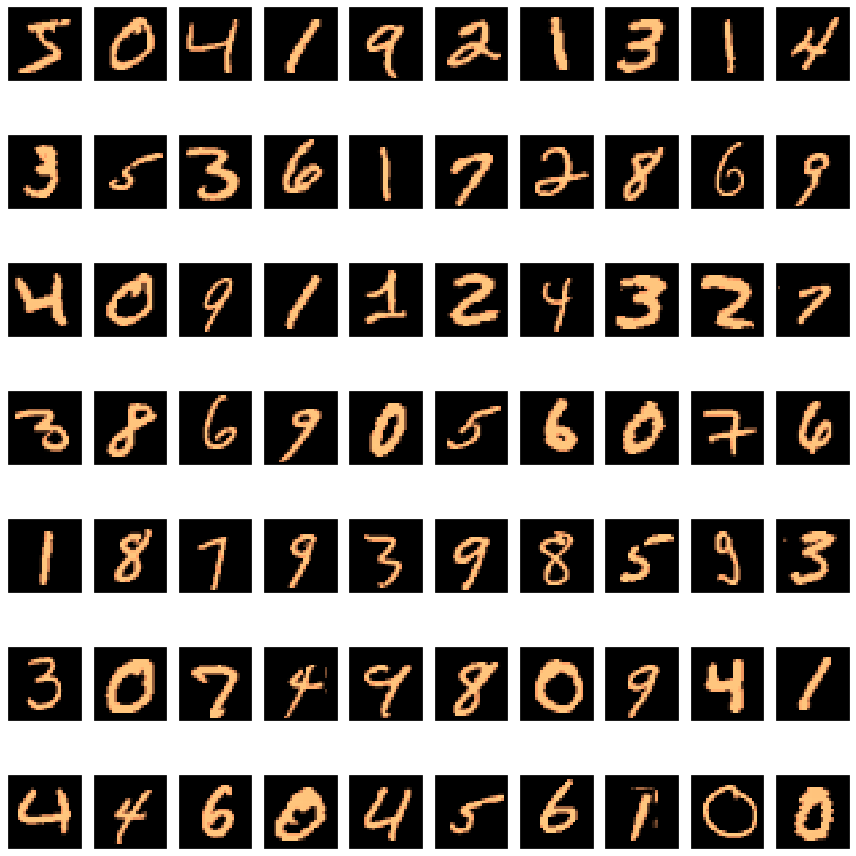

In [243]:
plt.figure(figsize=(12,13))

for i in list(range(0,70)):
    plt.subplot(7,10,i+1)
    
    plt.imshow(train.iloc[i].values.reshape(28,28), interpolation = "none", cmap = "copper")
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
               
plt.tight_layout

PCA Implementation via Sklearn
Now using the Sklearn toolkit, we implement the Principal Component Analysis algorithm as follows:

In [244]:
#Standardising Data and Implementing PCA

X_=train[:6000].values
X_std_=StandardScaler().fit_transform(X_)
pca_=PCA(5)
X_5d=pca_.fit_transform(X_std_)
Target=target[:6000]

What the chunk of code does above is to first normalise the data (actually no need to do so for this data set as they are all 1's and 0's) using Sklearn's convenient StandardScaler call.

Next we invoke Sklearn's inbuilt PCA function by providing into its argument n_components, the number of components/dimensions we would like to project the data onto. In practise, one motivate the choice of components for example by looking at the proportion of variance captured vs each feature's eigenvalue, such as in our Explained Variance plots. However for the essence of this example , we  take a PCA on 5 components ( against perhaps taking 200 over components).

Finally we call both fit and transform methods which fits the PCA model with the standardised digit data set and then does a transformation by applying the dimensionality reduction on the data.

In [245]:
X_5d.shape

(6000, 5)

In [246]:
eigenvalues_=pca_.components_

In [247]:
eigenvalues_.shape

(5, 784)

## Visualisation of PCA Representations

Interactive visualisations of PCA representation
When it comes to these dimensionality reduction methods, scatter plots are most commonly implemented because they allow for great and convenient visualisations of clustering ( if any existed ) and this will be exactly what we will be doing as we plot the first 2 principal components as follows:

In [248]:
from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 39.2em; width: 78.5em; }</style>"))
trace = go.Scatter(
    x = X_5d[:,0],
    y = X_5d[:,1],
    name = str(Target),
    
    mode = 'markers',
    text = Target,
    showlegend = False,
    marker = dict(
        size = 8,
        color = Target,
        colorscale ='Jet',
        showscale = False,
        line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        ),
        
        opacity = 0.8
    )
)

data=[trace]

layout=go.Layout(title='PCA',
                hovermode='closest',
                xaxis=dict(
                    title='First Principal Direction',
                    ticklen=5,
                    zeroline=False),
                 yaxis=dict(
                 title='Second Principal Direction',
                 ticklen=5
            ),
                 showlegend=True
                
                    
                )
fig=dict(data=data,layout=layout)
py.iplot(fig,filename='pca')

Takeaway from the Plot

As observed from the scatter plot, you can just about make out a few discernible clusters evinced from the collective blotches of colors. These clusters represent the underlying digit that each data point should contribute to and one may therefore be tempted to think that it was quite easy to implement and visualising PCA in this section.

However, the devil lies in the tiny details of the python implementation because as alluded to earlier, PCA is actually in fact an unsupervised method which does not depend on class labels.

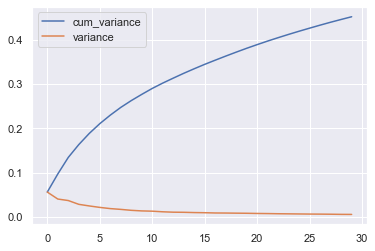

In [249]:
variance = pd.Series(pca.explained_variance_ratio_).sort_values(ascending=False)
plt.plot(np.cumsum(variance))
plt.plot(variance)
plt.legend(['cum_variance', 'variance'])

**As we can see that most of the variance is explained by 150 - 300 PC's so we will take those PC's which can explain about 90% of the variance**

In [250]:
pca_majority = PCA(n_components=152)

X_train_pca = pca_majority.fit_transform(X_train)
X_test_pca = pca_majority.transform(X_test)

**Lets Pirst Plot First 2 PC's**

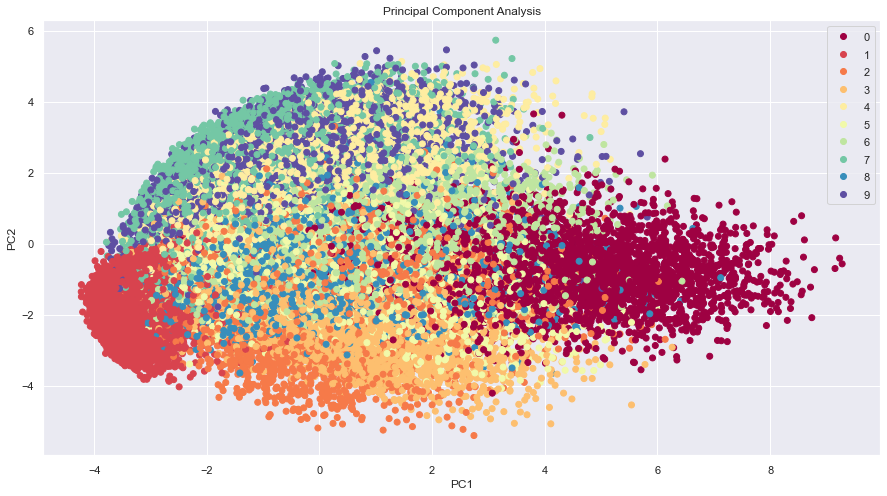

In [251]:
plt.figure(figsize=(15,8))
scatter = plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='Spectral')
handels, labels = scatter.legend_elements()
plt.legend(handels, labels)
plt.title('Principal Component Analysis')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [252]:
from sklearn import metrics 
svm.fit(X_train_pca, y_train)

pred = svm.predict(X_test_pca)

post_pca_svm = metrics.accuracy_score(y_test, pred)

In [253]:
acc = []

for i in range(1, 21, 1):
    knn = KNeighborsClassifier(n_neighbors=i, n_jobs=-1)
    knn.fit(X_train_pca, y_train)
    
    pred_knn = knn.predict(X_test_pca)
    acc.append(metrics.accuracy_score(y_test, pred_knn))

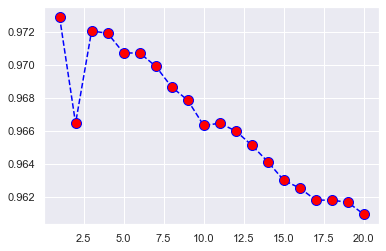

In [254]:
plt.plot(range(1,21,1), acc, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)

In [255]:
knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
knn.fit(X_train_pca, y_train)

pred_knn = knn.predict(X_test_pca)
post_pca_knn =metrics.accuracy_score(y_test, pred_knn)

**We can see that we have got max accuracy for neighbour 1 and 3**

In [256]:
knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
knn.fit(X_train, y_train)

pred_knn = knn.predict(X_test)
metrics.accuracy_score(y_test, pred_knn)

0.9705333333333334

In [257]:
rf.fit(X_train_pca, y_train)

pred_rf = rf.predict(X_test_pca)

post_pca_rf=metrics.accuracy_score(y_test, pred_rf)

In [258]:
xgb.fit(X_train, y_train)

pred_xgb = xgb.predict(X_test)

post_pca_xgb = metrics.accuracy_score(y_test, pred_xgb)

[20:29:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


**As we can see using PCA Accuracy of SVM and KNN has improved little bit, theres no change in the Accuracy of XG Boost and in case of Random Forest Accuracy has dropped**

# K - Means

Imagine just for a moment that we were not provided with the class labels to this digit set because after all PCA is an unsupervised method. Therefore how would we be able to separate out our data points in the new feature space? We can apply a clustering algorithm on our new PCA projection data and hopefully arrive at distinct clusters which would tell us something about the underlying class separation in the data.

To start off, we set up a KMeans clustering method with Sklearn's KMeans call and use the fit_predict method to compute cluster centers and predict cluster indices for the first and second PCA projections (to see if we can observe any appreciable clusters).

In [259]:
from sklearn.cluster import KMeans
kmeans=KMeans(9)
X_clustered=kmeans.fit_predict(X_5d)

In [260]:
tracekmeans = go.Scatter(x=X_5d[:, 0], y= X_5d[:, 1], mode="markers",
                    showlegend=False,
                    marker=dict(
                            size=8,
                            color = X_clustered,
                            colorscale = 'Portland',
                            showscale=False, 
                            line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        )
                   ))


layout=go.Layout(title='K-Means Clustering',
                 hovermode='closest',
                 xaxis=dict(title='First Principal Component',
                           ticklen=5,
                           zeroline=False,
                           gridwidth=2),
                 yaxis=dict(title='Second Principal Component',
                           ticklen=5,
                           gridwidth=2),
                 showlegend=True
                     )

data = [tracekmeans]
fig1 = dict(data=data, layout= layout)
# fig1.append_trace(contour_list)
py.iplot(fig1, filename="svm")

Takeaway from the Plot

Visually, the clusters generated by the KMeans algorithm appear to provide a clearer demarcation amongst clusters as compared to naively adding in class labels into our PCA projections. This should come as no surprise as PCA is meant to be an unsupervised method and therefore not optimised for separating different class labels. This particular task however is accomplished by the very next method that we will talk about.

In [261]:
tracekmeans

Scatter({
    'marker': {'color': array([5, 4, 0, ..., 5, 1, 6], dtype=int32),
               'colorscale': [[0.0, 'rgb(12,51,131)'], [0.25, 'rgb(10,136,186)'],
                              [0.5, 'rgb(242,211,56)'], [0.75, 'rgb(242,143,56)'],
                              [1.0, 'rgb(217,30,30)']],
               'line': {'color': 'rgb(255, 255, 255)', 'width': 2},
               'showscale': False,
               'size': 8},
    'mode': 'markers',
    'showlegend': False,
    'x': array([-0.92356117,  8.66852605,  2.1846898 , ..., -2.00962464,  0.96418696,
                -2.09580072]),
    'y': array([ -4.72831968,  -7.08179174,  10.65647554, ..., -10.08221339,
                 -2.95951795,   0.2506449 ])
})

## Using LDA

### Linear Discriminant Analysis (LDA)¶
1. LDA, much like PCA is also a linear transformation method commonly used in dimensionality reduction tasks. However unlike the latter which is an unsupervised learning algorithm, LDA falls into the class of supervised learning methods. As such the goal of LDA is that with available information about class labels, LDA will seek to maximise the separation between the different classes by computing the component axes (linear discriminants ) which does this.

In [262]:
lda=LDA(n_components=5)
X_lda = lda.fit_transform(X_std_,Target.values)

In [263]:
traceLDA=go.Scatter(x=X_lda[:,0],
                    y=X_lda[:,1],
                    #name=str(Target),
                    mode='markers',
                    #text=Target,
                    marker=dict(size=8,
                                color=Target,
                                colorscale='jet',
                                showscale=False,
                                line=dict(width=2,
                                         color='rgb(255,255,255)'
                                         ),
                                opacity=0.8
                               )
                )

data=traceLDA

layout=go.Layout(xaxis=dict(title='First Linear Discriminant',
                           ticklen=5,
                           gridwidth=2),
                yaxis=dict(title='Second Linear Discriminant',
                           ticklen=5,
                           gridwidth=2),
                 title='LDA',
                 showlegend=True,
                 hovermode='closest')

fig=dict(data=data,layout=layout)

In [264]:
traceLDA

Scatter({
    'marker': {'color': array([5, 0, 4, ..., 8, 6, 9]),
               'colorscale': [[0.0, 'rgb(0,0,131)'], [0.2, 'rgb(0,60,170)'], [0.4,
                              'rgb(5,255,255)'], [0.6, 'rgb(255,255,0)'], [0.8,
                              'rgb(250,0,0)'], [1.0, 'rgb(128,0,0)']],
               'line': {'color': 'rgb(255,255,255)', 'width': 2},
               'opacity': 0.8,
               'showscale': False,
               'size': 8},
    'mode': 'markers',
    'x': array([-1.02347712, -2.76931457,  2.26239263, ..., -2.01076859, -2.46598771,
                 3.2229435 ]),
    'y': array([-0.98424553, -4.6958151 ,  0.44877183, ...,  2.1404196 , -1.34482632,
                -0.98363009])
})

In [265]:
py.iplot(fig,filename='LDA')

### Loading the Results into Submission File

In [ ]:
submission = pd.DataFrame({'ImageId':range(1,28001), 'Label':pred_test_data})
submission

In [ ]:
submission.to_csv('submission.csv', index=False)

## Printing the Confusion Matrix

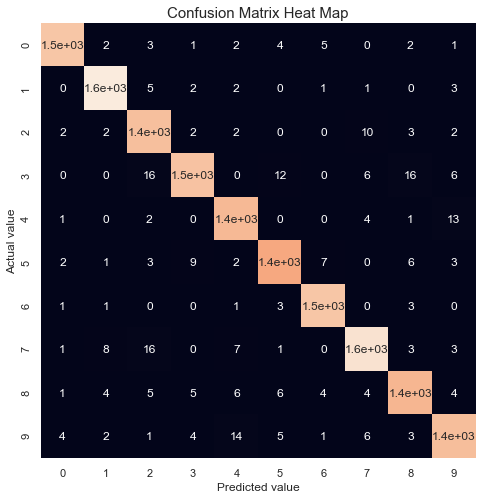

In [267]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
%matplotlib inline 
sns.set(color_codes=True)
#Visualization of Confusion Matrix in the form of a Heat Map
plt.figure(figsize = (12, 8))
mat = confusion_matrix(y_test, pred)
sns.heatmap(mat, square=True, annot=True, cbar=False)
plt.xlabel('Predicted value')
plt.ylabel('Actual value');
plt.title('Confusion Matrix Heat Map', fontsize = 15);

### Print Before values of Supervised Learning Models and After values of Supervised Learning Models Implemented with PCA

In [268]:
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score

#gives model report in dataframe

def model_report(name,accuracy_before,accuracy_hypertuned) :

    df = pd.DataFrame({"Model Name"             : [name],
                       "Accuracy Pre-PCA"           : [accuracy_before],
                       "Accuracy Post-PCA"          : [accuracy_hypertuned]
                      })
    
    return df

In [269]:
import plotly.figure_factory as ff#
import time
start_time = time.time()

#outputs for every model
model1 = model_report("SVM", pre_pca_svm,post_pca_svm)
model2 = model_report("Random Forest", pre_pca_rf,post_pca_rf)
model3 = model_report("XG Boost", pre_pca_xgb,post_pca_xgb)
model4 = model_report("KNN", pre_pca_knn,post_pca_knn)

#concat all models
model_performances = pd.concat([model1,model2,model3,
                                model4],axis = 0).reset_index()

model_performances = model_performances.drop(columns = "index",axis =1)
model_performances.sort_values(by=['Accuracy Post-PCA'],ascending= [False], inplace=True)

table  = ff.create_table(np.round(model_performances,4))

py.iplot(table)

#### Concluding Remarks

Thus Principal Component Analysis is used to remove the redundant features from the datasets without losing much information.These features are low dimensional in nature.The first component has the highest variance followed by second. PCA works best on data set having 2 or higher dimensions. Because, with higher dimensions, it becomes increasingly difficult to make interpretations from the resultant cloud of data.

In conclusion, this notebook has introduced and briefly covered three different dimensionality reduction methods commonly used by ML practitioners - PCA, LDA. We touched on the concepts of finding principal components and linear discriminants as well as the topology preserving capabilities of t-SNE. We've also discussed the relative merits of using supervised and unsupervised methods as well as the KMeans clustering technique when it comes to an unsupervised scenario.

Apart from these three common reduction methods, there exists a whole host of other dimensionality reduction methods not discussed in this notebook. Just to name a few, they include methods like Sammon's Mapping, Multi-dimensional Scaling or even some graph based visualisation methods.

## What else could have done in this model:
1. Hyperparameter tuning: As the dataset are quite large so for hyperparameter tuning computation time will be very high
2. Used roc-auc curve